In [479]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from adjustText import adjust_text
import synapseclient
from janitor import clean_names
import re
import string
import random
import collections
%matplotlib inline

## improve images
from IPython.display import set_matplotlib_formats, Image
set_matplotlib_formats('pdf', 'svg')
import json

#import rpy2.robjects as robjects
import rpy2.robjects as robjects
from rpy2.robjects import pandas2ri
pandas2ri.activate()

## sentiment analysis 
from textblob import TextBlob
from nltk.sentiment.vader import SentimentIntensityAnalyzer
# nltk.download('vader_lexicon')
# from watson_developer_cloud import NaturalLanguageUnderstandingV1
# from watson_developer_cloud.natural_language_understanding_v1 import Features, EntitiesOptions, KeywordsOptions, SentimentOptions, CategoriesOptions

## text pre-processing
# nltk.download('punkt')
# nltk.download('stopwords')
# nltk.download('averaged_perceptron_tagger')
# nltk.download('wordnet')
import nltk
from word2number import w2n
import unidecode
import contractions
from nltk.corpus import stopwords
from nltk.corpus import wordnet
from wordcloud import WordCloud
from nltk.stem import WordNetLemmatizer 
from sklearn.decomposition import PCA
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

## models
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV

## metrics
from sklearn.neighbors import DistanceMetric
from sklearn.metrics import make_scorer
from sklearn.metrics import mean_squared_error
# from sklearn.metrics import f1_score
from sklearn.model_selection import cross_val_score

## Venn diagram package
from matplotlib_venn import venn3, venn3_circles

# import warnings
# warnings.filterwarnings('ignore')

In [480]:
seed = 123

# Import Data

In [481]:
login = ''
pwd = ''

In [482]:
syn = synapseclient.Synapse()
syn.login(login, pwd, rememberMe=True)

Welcome, Jess White!



## Import Drug Screening Data


In [483]:
#from Synapse-stored csv
drug_data_path = syn.get("syn20682897").path
data = pd.read_csv(drug_data_path, low_memory=False)

#from Synapse table
results = syn.tableQuery("SELECT * FROM syn20556247")
data = results.asDataFrame()

[WARNING] C:\Users\jessb\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3343: DtypeWarning: Columns (10) have mixed types.Specify dtype option on import or set low_memory=False.



In [159]:
## saved as csv file in case we lose access
# compression_opts = dict(method='zip',
#                         archive_name='out.csv')

# data.to_csv('../assets/out.zip',
#             compression=compression_opts, index=False)

## Elsevier Data

In [ ]:
# df_journal = pd.read_json(syn.get("syn22797452").path, lines=True)

with open('../assets/elsevier/ctf-hackathon-upload.json', encoding='iso-8859-1') as f:
  df_journal = json.load(f)

## Drug Annotations

### Drug Target Explorer Data

In [503]:
targetspath = syn.get('syn17091507')
readRDS = robjects.r['readRDS']

df_drugs = readRDS(targetspath.path)

In [504]:
df_drugs.columns

Index(['internal_id', 'hugo_gene', 'n_quantitative', 'mean_pchembl', 'cv',
       'sd', 'IC50_nM', 'AC50_nM', 'EC50_nM', 'Potency_nM', 'Ki_nM', 'Kd_nM',
       'n_qualitative', 'std_name', 'total_n', 'confidence', 'pchembl_d',
       'pchembl_t', 'known_selectivity_index'],
      dtype='object')

In [505]:
## tutorial suggests defining real MOA as mean_pchembl > 6
df_drugs_moa = (df_drugs
                .query('mean_pchembl > 6')
                .filter(["internal_id", "hugo_gene", "std_name"])
                .drop_duplicates())
    
df_drugs_moa.head()

,internal_id,hugo_gene,std_name
1,3,HTR7,CHEMBL2413451
2,4,CHRNA4,CHEMBL204871
3,4,CHRNB2,CHEMBL204871
4,5,GSK3A,CHEMBL3582401
5,6,FAAH,CHEMBL2386554


### Thesis Annotations

In [508]:
df_moa = pd.read_csv('../assets/moa.csv', header=0)

In [509]:
## replace - with ""
df_moa.Drugs = df_moa.Drugs.replace("-", "", regex = True)
## set all values lower case
df_moa.Drugs = df_moa.Drugs.str.lower()

# df_moa = df_moa.drop_duplicates()

# Drug Screening Data Prep

## Drug Screening EDA

In [510]:
data.head()

,data_contributor,data_contact,drug_screen_id,drug_assay_id,experiment_synapse_id,study_synapse_id,funder,model_name,cellosaurus_id,organism_name,...,dosage,dosage_unit,response,response_type,response_unit,model_type,disease_name,disease_efo_id,symptom_name,symptom_efo_id
5010113_3768,UMN,3335875,1,syn11373153.17,syn11373153.1,syn5610425,CTF,N10,NaN,human,...,100.000000,uM,99.979123,percent viability,%,cell line,no disease,NaN,no symptom,NaN
5010114_3768,UMN,3335875,1,syn11373153.18,syn11373153.1,syn5610425,CTF,N10,NaN,human,...,33.333430,uM,103.789330,percent viability,%,cell line,no disease,NaN,no symptom,NaN
5010115_3768,UMN,3335875,1,syn11373153.19,syn11373153.1,syn5610425,CTF,N10,NaN,human,...,11.111175,uM,102.178887,percent viability,%,cell line,no disease,NaN,no symptom,NaN
5010116_3768,UMN,3335875,1,syn11373153.20,syn11373153.1,syn5610425,CTF,N10,NaN,human,...,3.703736,uM,104.653527,percent viability,%,cell line,no disease,NaN,no symptom,NaN
5010117_3768,UMN,3335875,1,syn11373153.21,syn11373153.1,syn5610425,CTF,N10,NaN,human,...,1.234554,uM,105.312040,percent viability,%,cell line,no disease,NaN,no symptom,NaN


In [511]:
data.shape

(928480, 22)

In [512]:
col_list = data.columns.to_list()

for n in col_list:
    print(n)
    print(data[n].value_counts())
    print()

data_contributor
NCATS    881838
UCF       22174
UMN       21408
MGH        3060
Name: data_contributor, dtype: int64

data_contact
3334155    881838
3334459     22174
3335875     21408
3321266      3060
Name: data_contact, dtype: int64

drug_screen_id
41423    576
17131    360
21640    360
21437    360
19371    360
        ... 
41312     10
41313     10
41314     10
41308     10
41311     10
Name: drug_screen_id, Length: 43371, dtype: int64

drug_assay_id
syn18457441.30527    2
syn18457466.32789    2
syn18457441.29053    2
syn18457474.2097     2
syn18457441.10689    2
                    ..
syn6138251.9182      1
syn12293957.18812    1
syn5522642.2024      1
syn12293963.20556    1
syn6138251.12414     1
Name: drug_assay_id, Length: 689680, dtype: int64

experiment_synapse_id
syn18457448.1    56760
syn18457441.1    56760
syn18457466.1    56760
syn18457456.1    56760
syn6138251.1     25234
                 ...  
syn11373167.1       32
syn11373414.1       32
syn11373541.1       32
syn113

In [513]:
data.apply(lambda x: sum(x.isnull()), axis=0)

data_contributor                0
data_contact                    0
drug_screen_id                  0
drug_assay_id                   0
experiment_synapse_id           0
study_synapse_id                0
funder                          0
model_name                      0
cellosaurus_id             886076
organism_name                   0
drug_name                       0
DT_explorer_internal_id         0
dosage                          0
dosage_unit                     0
response                        0
response_type                   0
response_unit                   0
model_type                      0
disease_name                    0
disease_efo_id             928480
symptom_name                    0
symptom_efo_id             605754
dtype: int64

In [514]:
data.dtypes

data_contributor            object
data_contact                 int64
drug_screen_id               int64
drug_assay_id               object
experiment_synapse_id       object
study_synapse_id            object
funder                      object
model_name                  object
cellosaurus_id              object
organism_name               object
drug_name                   object
DT_explorer_internal_id      int64
dosage                     float64
dosage_unit                 object
response                   float64
response_type               object
response_unit               object
model_type                  object
disease_name                object
disease_efo_id             float64
symptom_name                object
symptom_efo_id             float64
dtype: object

In [515]:
print(data[(data.symptom_name == 'meningioma')].disease_name.value_counts())
print()
print(data[(data.symptom_name == 'schwannoma')].disease_name.value_counts())
print()
print(data[(data.symptom_name == 'pNF')].disease_name.value_counts())
print()
print(data[(data.symptom_name == 'no symptom')].disease_name.value_counts())

NF2    43424
Name: disease_name, dtype: int64

NF2    33342
Name: disease_name, dtype: int64

NF1    147224
Name: disease_name, dtype: int64

no disease    387187
NF2           306599
NF1            10704
Name: disease_name, dtype: int64


In [516]:
set(data.model_name.loc[((data.symptom_name == 'meningioma')|
                         (data.symptom_name == 'schwannoma')|
                         (data.symptom_name == 'pNF'))])

{'Ben-Men-1',
 'MS01',
 'MS02',
 'MS03',
 'Syn10',
 'Syn12',
 'Syn7',
 'ipNF05.5 (mixed clone)',
 'ipNF05.5 (single clone)',
 'ipNF06.2A',
 'ipNF95.11b C',
 'ipNF95.11b C/T',
 'ipNF95.6',
 'ipnNF95.11C'}

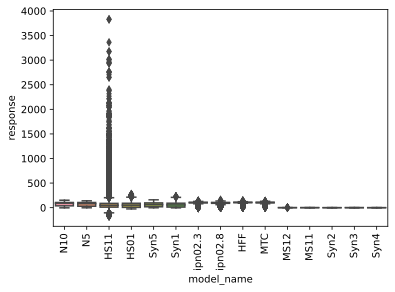

In [518]:
ax = sns.boxplot(x = 'model_name', y = 'response', 
                 data = data.loc[(data.symptom_name == 'no symptom')]);
ax = ax.set_xticklabels(ax.get_xticklabels(),rotation=90);

## Drug Screening Pre-Processing

In [519]:
## dosage unit all micromolar
## respose type all percent viability
## response unit all %
## model type all cell line
## cellosaurus_id, disease_efo_id, symptom_efo_id
## contain a lot of missing data and no key

drop_list = ['dosage_unit', 'response_type', 'response_unit', 
             'model_type', 'disease_efo_id', 'symptom_efo_id', 
             'cellosaurus_id']

data.drop(columns = drop_list, inplace = True)

In [520]:
## df_drugs contains duplicates (ordered by MOA)
## keep only internal_id and std_name for mapping
df_drug_min = df_drugs.loc[:, ['internal_id', 'std_name']]
df_drug_min.drop_duplicates(inplace=True)

print(df_drug_min.shape)
print(len(set(df_drug_min.internal_id)))
print(len(set(df_drug_min.std_name)))

data = data.merge(df_drug_min,
                  left_on = "DT_explorer_internal_id",
                  right_on = "internal_id",
                  how = "inner")

(305219, 2)
305219
305219


Looks like some % viability expressed as integers and others as %.  HS11 seems like an outlier even when adjusting so dropped those rows.

In [521]:
## drop HS11 cell line
## too high to be merely integer viability
data = data[(data.model_name != 'HS11')]

In [522]:
set(data.model_name)

{'Ben-Men-1',
 'HFF',
 'HS01',
 'MS01',
 'MS02',
 'MS03',
 'MS11',
 'MS12',
 'MTC',
 'N10',
 'N5',
 'Syn1',
 'Syn10',
 'Syn12',
 'Syn2',
 'Syn3',
 'Syn4',
 'Syn5',
 'Syn7',
 'ipNF05.5 (mixed clone)',
 'ipNF05.5 (single clone)',
 'ipNF06.2A',
 'ipNF95.11b C',
 'ipNF95.11b C/T',
 'ipNF95.6',
 'ipn02.3',
 'ipn02.8',
 'ipnNF95.11C'}

In [523]:
## cell lines where viability expressed as integer instead of %
scale_list = ['Ben-Men-1', 'MS02', 'ipNF05.5 (mixed clone)', 'ipNF05.5 (single clone)',
              'ipNF06.2A', 'ipNF95.11b C', 'ipNF95.11b C/T', 'ipNF95.6', 'ipnNF95.11C', 
              'N10', 'N5', 'HS01', 'Syn1', 'Syn5', 'ipn02.3', 'ipn02.8', 'HFF', 'MTC']

In [524]:
# check that the integer scaled to percent are not outliers
ax = sns.boxplot(x = 'model_name', y = 'response', 
                 data = data.loc[(data.model_name.apply(lambda x: x in scale_list))]);
ax = ax.set_xticklabels(ax.get_xticklabels(),rotation=90);

In [525]:
## replace integer values with percentage
data.loc[(data.model_name.apply(lambda x: x in scale_list)), "response"] =\
    data.loc[(data.model_name.apply(lambda x: x in scale_list)), "response"]/100

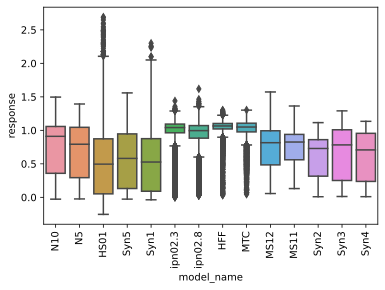

In [526]:
## for no symptom cell lines
ax = sns.boxplot(x = 'model_name', y = 'response', 
                 data = data.loc[(data.symptom_name == 'no symptom')]);
ax = ax.set_xticklabels(ax.get_xticklabels(),rotation=90);

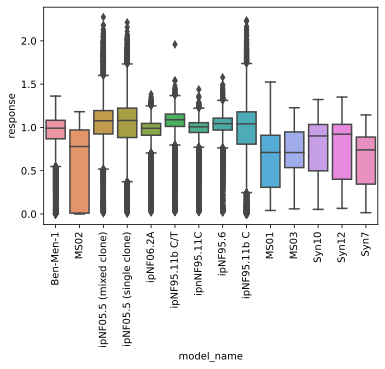

In [527]:
## for disease cell lines
ax = sns.boxplot(x = 'model_name', y = 'response', 
                 data = data.loc[((data.symptom_name == 'meningioma')|
                                  (data.symptom_name == 'schwannoma')|
                                 (data.symptom_name == 'pNF'))]);
ax = ax.set_xticklabels(ax.get_xticklabels(),rotation=90);

In [528]:
## extract only cell line,symptom, and disease
## remove repeats and store in single dataframe
df_cell_disease = data.loc[:, ['model_name', 'symptom_name', 'disease_name']]
df_cell_disease.drop_duplicates(inplace=True)
df_cell_disease.reset_index(inplace=True)
df_cell_disease.head()

,index,model_name,symptom_name,disease_name
0,0,N10,no symptom,no disease
1,16,N5,no symptom,NF1
2,32,Ben-Men-1,meningioma,NF2
3,43,MS02,schwannoma,NF2
4,65,HS01,no symptom,NF2


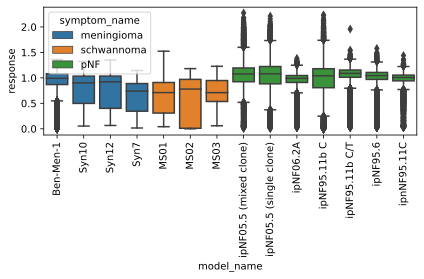

In [529]:
ax = sns.boxplot(x = 'model_name', y = 'response', hue = 'symptom_name',
                 data = data.loc[((data.symptom_name == 'meningioma')|
                                  (data.symptom_name == 'schwannoma')|
                                 (data.symptom_name == 'pNF'))],
                 order=['Ben-Men-1', 'Syn10', 'Syn12', 'Syn7',
                        'MS01', 'MS02', 'MS03',
                        'ipNF05.5 (mixed clone)', 'ipNF05.5 (single clone)',
                        'ipNF06.2A', 'ipNF95.11b C', 'ipNF95.11b C/T',
                        'ipNF95.6', 'ipnNF95.11C'],
                 dodge=False);
ax = ax.set_xticklabels(ax.get_xticklabels(),rotation=90);

plt.tight_layout()
plt.savefig("../images/Fig2.png", dpi=410)

## MEK inhibitor comparison

In [530]:
df_mek = data[((data.std_name.str.lower() == 'selumetinib') |
               (data.std_name.str.lower() == 'trametinib') |
               (data.std_name.str.lower() == 'binimetinib') |
               (data.std_name.str.lower() == 'pd-0325901'))]

df_mek = df_mek[(data.symptom_name == 'pNF')]

df_mek.loc[:, 'std_name'] = df_mek.std_name.astype('string')

df_mek.std_name.value_counts()

[WARNING] <ipython-input-530-0f326f05a618>:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.



SELUMETINIB    77
BINIMETINIB    77
PD-0325901     77
TRAMETINIB     77
Name: std_name, dtype: Int64

In [531]:
df_mek.symptom_name.value_counts()

pNF    308
Name: symptom_name, dtype: int64

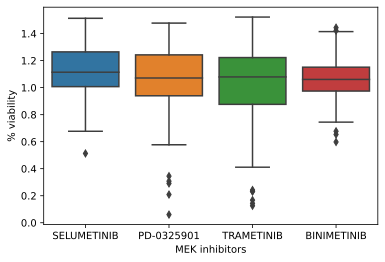

In [532]:
sns.boxplot(x = 'std_name', y = 'response', data = df_mek);
plt.xlabel('MEK inhibitors');
plt.ylabel('% viability');
plt.savefig("../images/Fig3.png", dpi=410);

### Summary by Cell Line

In [ ]:
## will take a while to run
data_cell_median = (data
                    .groupby('std_name').filter(lambda x: len(x)>3)
                    .filter(['std_name', 'response','model_name'])
                    .groupby(['std_name','model_name'],as_index = False).median())

data_cell_mean = (data
                  .groupby('std_name').filter(lambda x: len(x)>3)
                  .filter(['std_name', 'response','model_name'])
                  .groupby(['std_name','model_name'],as_index = False).mean())

data_cell_min = (data
                 .groupby('std_name').filter(lambda x: len(x)>3)
                 .filter(['std_name', 'response','model_name'])
                 .groupby(['std_name','model_name'],as_index = False).min())

data_cell_max = (data
                 .groupby('std_name').filter(lambda x: len(x)>3)
                 .filter(['std_name', 'response','model_name'])
                 .groupby(['std_name','model_name'],as_index = False).max())

data_cell_median.dropna(axis=0, inplace=True)
data_cell_mean.dropna(axis=0, inplace=True)
data_cell_min.dropna(axis=0, inplace=True)
data_cell_max.dropna(axis=0, inplace=True)

data_cell_median.rename(columns={'response':'median'}, inplace=True) 
data_cell_mean.rename(columns={'response':'mean'}, inplace=True)
data_cell_min.rename(columns={'response':'min'}, inplace=True)
data_cell_max.rename(columns={'response':'max'}, inplace=True)

print(data_cell_median.shape)
print(data_cell_mean.shape)
print(data_cell_min.shape)
print(data_cell_max.shape)

In [35]:
data_cell_summary = data_cell_median.merge(data_cell_mean,
                                           left_on = ['std_name', 'model_name'],
                                           right_on = ['std_name', 'model_name'],
                                           how = "inner")

data_cell_summary = data_cell_summary.merge(data_cell_min,
                                            left_on = ['std_name', 'model_name'],
                                            right_on = ['std_name', 'model_name'],
                                            how = "inner")

data_cell_summary = data_cell_summary.merge(data_cell_max,
                                            left_on = ['std_name', 'model_name'],
                                            right_on = ['std_name', 'model_name'],
                                            how = "inner")

print(data_cell_summary.shape)
data_cell_summary.head()

(19094, 6)


,std_name,model_name,median,mean,min,max
0,(-)-Deoxypodophyllotoxin,N10,0.600546,0.694651,0.479870,1.162219
1,(-)-Deoxypodophyllotoxin,N5,0.398599,0.548063,0.328342,1.284884
2,(-)-Gambogic Acid,N10,0.368344,0.506716,-0.008534,1.130643
3,(-)-Gambogic Acid,N5,0.412480,0.453455,-0.007143,0.966614
4,(-)-NORADRENALINE,Ben-Men-1,0.893658,0.884852,0.741394,1.023629


In [410]:
## https://towardsdatascience.com/name-your-favorite-excel-function-and-ill-teach-you-its-pandas-equivalent-7ee4400ada9f
data_cell_summary['disease_name'] = \
    data_cell_summary.model_name.map(df_cell_disease.set_index('model_name')['disease_name'].to_dict())
data_cell_summary['symptom_name'] = \
    data_cell_summary.model_name.map(df_cell_disease.set_index('model_name')['symptom_name'].to_dict())

data_cell_summary.head()

,std_name,model_name,median,mean,min,max,disease_name,symptom_name
0,(-)-Deoxypodophyllotoxin,N10,0.600546,0.694651,0.479870,1.162219,no disease,no symptom
1,(-)-Deoxypodophyllotoxin,N5,0.398599,0.548063,0.328342,1.284884,NF1,no symptom
2,(-)-Gambogic Acid,N10,0.368344,0.506716,-0.008534,1.130643,no disease,no symptom
3,(-)-Gambogic Acid,N5,0.412480,0.453455,-0.007143,0.966614,NF1,no symptom
4,(-)-NORADRENALINE,Ben-Men-1,0.893658,0.884852,0.741394,1.023629,NF2,meningioma


In [366]:
print(data_cell_summary.dtypes)
data_cell_summary['std_name'] = data_cell_summary.std_name.astype(str)

std_name        category
model_name        object
median           float64
mean             float64
min              float64
max              float64
disease_name      object
dtype: object


In [411]:
# saved as csv file since takes some time to run
# compression_opts = dict(method='zip',
#                         archive_name='out.csv')

data_cell_summary.to_csv('../assets/data_cell_summary.csv', index=False)
#             compression=compression_opts)

### Summary by Disease

In [236]:
## will take a while to run
data_disease_median = (data
                       .groupby('std_name').filter(lambda x: len(x)>3)
                       .filter(['std_name', 'response','symptom_name'])
                       .groupby(['std_name','symptom_name'],as_index = False).median())

data_disease_mean = (data
                     .groupby('std_name').filter(lambda x: len(x)>3)
                     .filter(['std_name', 'response','symptom_name'])
                     .groupby(['std_name','symptom_name'],as_index = False).mean())

data_disease_min = (data
                    .groupby('std_name').filter(lambda x: len(x)>3)
                    .filter(['std_name', 'response','symptom_name'])
                    .groupby(['std_name','symptom_name'],as_index = False).min())

data_disease_max = (data
                    .groupby('std_name').filter(lambda x: len(x)>3)
                    .filter(['std_name', 'response','symptom_name'])
                    .groupby(['std_name','symptom_name'],as_index = False).max())

data_disease_median.dropna(axis=0, inplace=True)
data_disease_mean.dropna(axis=0, inplace=True)
data_disease_min.dropna(axis=0, inplace=True)
data_disease_max.dropna(axis=0, inplace=True)

data_disease_median.rename(columns={'response':'median'}, inplace=True) 
data_disease_mean.rename(columns={'response':'mean'}, inplace=True)
data_disease_min.rename(columns={'response':'min'}, inplace=True)
data_disease_max.rename(columns={'response':'max'}, inplace=True)

print(data_disease_median.shape)
print(data_disease_mean.shape)
print(data_disease_min.shape)
print(data_disease_max.shape)

(4802, 3)
(4802, 3)
(4802, 3)
(4802, 3)


In [237]:
data_disease_summary = data_disease_median.merge(data_disease_mean,
                                                 left_on = ['std_name', 'symptom_name'],
                                                 right_on = ['std_name', 'symptom_name'],
                                                 how = "inner")

data_disease_summary = data_disease_summary.merge(data_disease_min,
                                                  left_on = ['std_name', 'symptom_name'],
                                                  right_on = ['std_name', 'symptom_name'],
                                                  how = "inner")

data_disease_summary = data_disease_summary.merge(data_disease_max,
                                                  left_on = ['std_name', 'symptom_name'],
                                                  right_on = ['std_name', 'symptom_name'],
                                                  how = "inner")

print(data_disease_summary.shape)
data_disease_summary.head()

(4802, 6)


,std_name,symptom_name,median,mean,min,max
0,(-)-Deoxypodophyllotoxin,no symptom,0.517772,0.621357,0.328342,1.284884
1,(-)-Gambogic Acid,no symptom,0.368344,0.480085,-0.008534,1.130643
2,(-)-NORADRENALINE,meningioma,0.893658,0.884852,0.741394,1.023629
3,(-)-NORADRENALINE,no symptom,1.038622,1.019079,0.384903,1.172962
4,(-)-NORADRENALINE,pNF,1.017886,1.021358,0.616536,1.238870


In [238]:
## https://towardsdatascience.com/name-your-favorite-excel-function-and-ill-teach-you-its-pandas-equivalent-7ee4400ada9f
data_disease_summary['disease_name'] = \
    data_disease_summary.symptom_name.map(df_cell_disease.set_index('symptom_name')['disease_name'].to_dict())

data_disease_summary.head()

,std_name,symptom_name,median,mean,min,max,disease_name
0,(-)-Deoxypodophyllotoxin,no symptom,0.517772,0.621357,0.328342,1.284884,NF2
1,(-)-Gambogic Acid,no symptom,0.368344,0.480085,-0.008534,1.130643,NF2
2,(-)-NORADRENALINE,meningioma,0.893658,0.884852,0.741394,1.023629,NF2
3,(-)-NORADRENALINE,no symptom,1.038622,1.019079,0.384903,1.172962,NF2
4,(-)-NORADRENALINE,pNF,1.017886,1.021358,0.616536,1.238870,NF1


In [364]:
print(data_disease_summary.dtypes)
data_disease_summary['std_name'] = data_disease_summary.std_name.astype(str)

std_name         object
symptom_name     object
median          float64
mean            float64
min             float64
max             float64
disease_name     object
dtype: object


In [239]:
# saved as csv file since takes some time to run
data_disease_summary.to_csv('../assets/data_disease_summary.csv', index=False)

### Meningioma

In [533]:
df_meningioma = data.copy()
df_meningioma = df_meningioma[(df_meningioma.symptom_name == 'meningioma')]
df_meningioma.shape

(26288, 17)

In [534]:
df_meningioma.organism_name.value_counts()

human    26288
Name: organism_name, dtype: int64

In [535]:
df_meningioma.model_name.value_counts()

Ben-Men-1    25448
Syn7           280
Syn10          280
Syn12          280
Name: model_name, dtype: int64

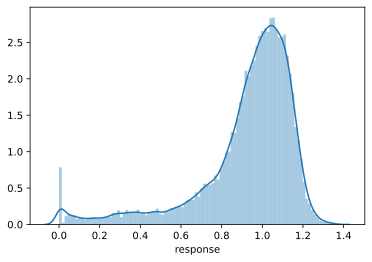

In [536]:
sns.distplot(df_meningioma.response, bins = 100);

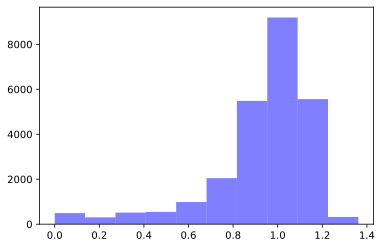

In [537]:
plt.hist(df_meningioma.response[(df_meningioma.model_name == 'Ben-Men-1')], alpha = 0.5, color = 'blue');

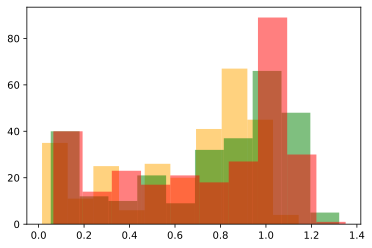

In [538]:
plt.hist(df_meningioma.response[(df_meningioma.model_name == 'Syn7')], alpha = 0.5, color = 'orange');
plt.hist(df_meningioma.response[(df_meningioma.model_name == 'Syn10')], alpha = 0.5, color = 'green');
plt.hist(df_meningioma.response[(df_meningioma.model_name == 'Syn12')], alpha = 0.5, color = 'red');

Consider normalizing % viability output

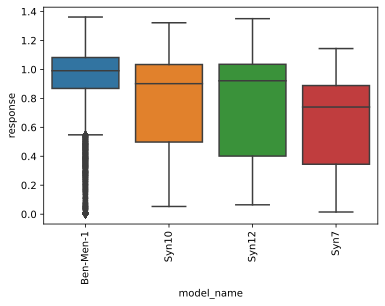

In [539]:
ax = sns.boxplot(x = 'model_name', y = 'response', data = df_meningioma);
ax = ax.set_xticklabels(ax.get_xticklabels(),rotation=90);

### Schwannoma

In [540]:
df_schwannoma = data.copy()
df_schwannoma = df_schwannoma[(df_schwannoma.symptom_name == 'schwannoma')]
df_schwannoma.shape

(22950, 17)

In [541]:
df_schwannoma.organism_name.value_counts()

mouse    22950
Name: organism_name, dtype: int64

In [542]:
df_schwannoma.model_name.value_counts()

MS02    17192
MS01     4606
MS03     1152
Name: model_name, dtype: int64

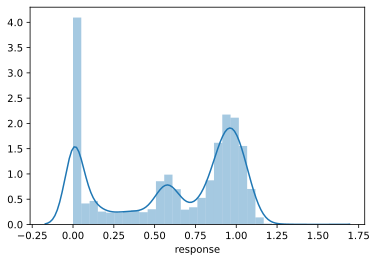

In [543]:
sns.distplot(df_schwannoma.response, bins = 30);

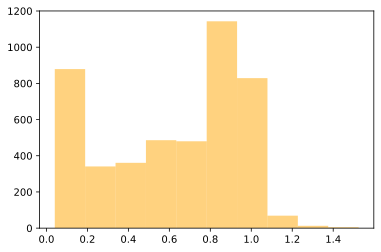

In [544]:
plt.hist(df_schwannoma.response[(df_schwannoma.model_name == 'MS01')], alpha = 0.5, color = 'orange');

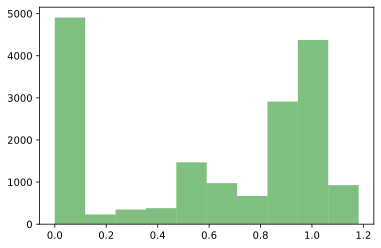

In [545]:
plt.hist(df_schwannoma.response[(df_schwannoma.model_name == 'MS02')], alpha = 0.5, color = 'green');

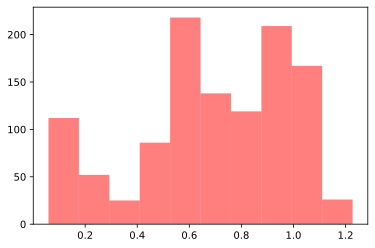

In [546]:
plt.hist(df_schwannoma.response[(df_schwannoma.model_name == 'MS03')], alpha = 0.5, color = 'red');

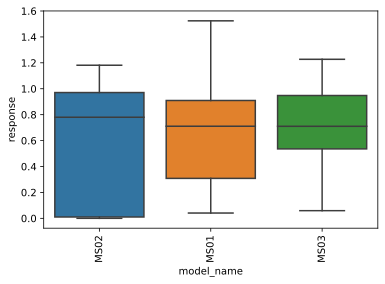

In [547]:
ax = sns.boxplot(x = 'model_name', y = 'response', data = df_schwannoma);
ax = ax.set_xticklabels(ax.get_xticklabels(),rotation=90);

### pNF

In [548]:
df_plexiform = data.copy()
df_plexiform = df_plexiform[(df_plexiform.symptom_name == 'pNF')]
df_plexiform.shape

(88088, 17)

In [549]:
df_plexiform.organism_name.value_counts()

human    88088
Name: organism_name, dtype: int64

In [550]:
df_plexiform.model_name.value_counts()

ipNF95.6                   12584
ipNF95.11b C               12584
ipNF05.5 (single clone)    12584
ipNF05.5 (mixed clone)     12584
ipnNF95.11C                12584
ipNF06.2A                  12584
ipNF95.11b C/T             12584
Name: model_name, dtype: int64

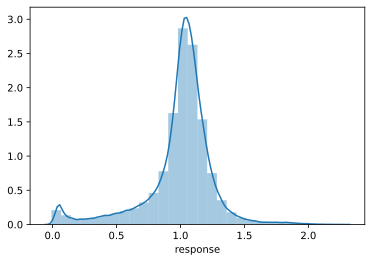

In [551]:
sns.distplot(df_plexiform.response, bins = 30);

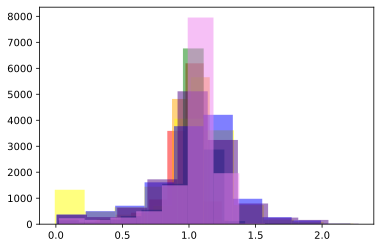

In [552]:
plt.hist(df_plexiform.response[(df_plexiform.model_name == 'ipNF06.2A')], alpha = 0.5, color = 'red');
plt.hist(df_plexiform.response[(df_plexiform.model_name == 'ipnNF95.11C')], alpha = 0.5, color = 'orange');
plt.hist(df_plexiform.response[(df_plexiform.model_name == 'ipNF95.11b C')], alpha = 0.5, color = 'yellow');
plt.hist(df_plexiform.response[(df_plexiform.model_name == 'ipNF95.6')], alpha = 0.5, color = 'green');
plt.hist(df_plexiform.response[(df_plexiform.model_name == 'ipNF05.5 (single clone)')], alpha = 0.5, color = 'blue');
plt.hist(df_plexiform.response[(df_plexiform.model_name == 'ipNF05.5 (mixed clone)')], alpha = 0.5, color = 'indigo');
plt.hist(df_plexiform.response[(df_plexiform.model_name == 'ipNF95.11b C/T')], alpha = 0.5, color = 'violet');

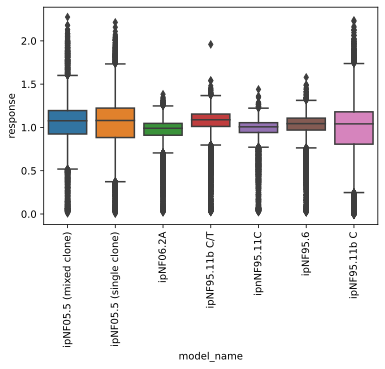

In [553]:
ax = sns.boxplot(x = 'model_name', y = 'response', data = df_plexiform);
ax = ax.set_xticklabels(ax.get_xticklabels(),rotation=90);

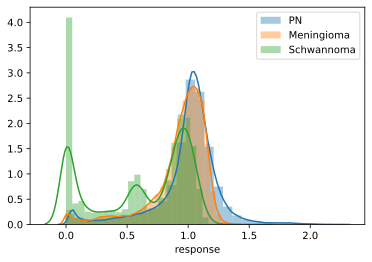

In [554]:
sns.distplot(df_plexiform.response, bins = 30);
sns.distplot(df_meningioma.response, bins = 30);
sns.distplot(df_schwannoma.response, bins = 30);
plt.legend(['PN', 'Meningioma', 'Schwannoma']);

# Prep Journal Articles

In [61]:
df_journal.meta_language.value_counts()

English       5164
Spanish         94
Japanese        90
French          84
Chinese         64
German          59
Russian         29
Turkish         24
Dutch           14
Portuguese      13
Czech           10
Polish          10
Korean          10
Italian          8
Hungarian        8
Bulgarian        5
Serbian          3
Persian          2
Croatian         2
Swedish          2
Danish           2
Estonian         1
Romanian         1
Greek            1
Slovak           1
Arabic           1
Name: meta_language, dtype: int64

In [62]:
df_journal.columns

Index(['Eid', 'abstract', 'affiliation_organization', 'title', 'year',
       'sourcetitle', 'issn_print', 'doi', 'openaccess', 'meta_language',
       'References', 'pmid', 'publishername', 'keywords', 'funding_text'],
      dtype='object')

In [63]:
df_journal_en = df_journal.copy()
df_journal_en = df_journal_en[(df_journal_en.meta_language == 'English')]
df_journal_en.reset_index(drop=True, inplace=True)

In [64]:
df_journal_en.shape

(5164, 15)

In [65]:
df_journal_en['meningioma'] = list(df_journal_en.abstract.apply(lambda x: 1 if str(x).lower().find('meningioma')>=0 else 0))

df_journal_en['schwannoma'] = list(df_journal_en.abstract.apply(lambda x: 1 if str(x).lower().find('schwannoma')>=0 else 0))

df_journal_en['plexiform'] = list(df_journal_en.abstract.apply(lambda x: 1 if str(x).lower().find('plexiform')>=0 else 0))

In [66]:
abstract_series = df_journal_en.abstract.replace("-", "", regex = True).str.lower()

abstract_series

0       introduction. neurofibromatosis type 1 is an a...
1                                                     NaN
2       malignant peripheral nerve sheath tumors accou...
3       we report a 20yearold man with cauda equina sy...
4       objective:: to determine the best surgical str...
                              ...                        
5159    neurofibromatosis type 1 (nf1) is a common tum...
5160    stereotactic radiosurgery (srs) has been used ...
5161    purpose:to evaluate the natural history of mye...
5162    purpose: although some specific genetic syndro...
5163    vasculopathy is a wellrecognized abnormality a...
Name: abstract, Length: 5164, dtype: object

## Drugs from Target Explorer

### Meningioma

In [172]:
abstract_meningioma = abstract_series[(df_journal_en.meningioma == 1)]
abstract_no_list = abstract_meningioma.index.to_list()
abstract_meningioma.reset_index(drop=True, inplace=True)
abstract_meningioma = pd.DataFrame({'abstract': abstract_meningioma,
                                   'abstract_no': abstract_no_list})

In [173]:
drugs_meningioma = data_disease_summary.std_name.loc[(data_disease_summary.symptom_name == 'meningioma')]

## replace - with ""
drugs_meningioma = drugs_meningioma.replace("-", "", regex = True)
## set all values lower case
drugs_meningioma = drugs_meningioma.str.lower()
## remove white spaces
# drugs_meningioma = drugs_meningioma.str.strip()
## remove duplicates
drugs_meningioma = list(set(drugs_meningioma.to_list()))

print(len(drugs_meningioma))

1144


In [174]:
idx_list_meningioma = []

for n in drugs_meningioma:
    temp_list = abstract_meningioma.abstract.str.find(n).to_list()
    temp_idx = [i for i, j in enumerate(temp_list) if j >= 0]
    idx_list_meningioma.append(temp_idx)

idx_drug_meningioma = [i for i, j in enumerate(idx_list_meningioma) if j != []]
drug_list_meningioma = [drugs_meningioma[i] for i in idx_drug_meningioma]
idx_list_meningioma = [i for i in idx_list_meningioma if i != []]

In [175]:
print(idx_list_meningioma)
print()
print(drug_list_meningioma)

[[77], [207], [30, 87], [24], [49], [49], [109], [33], [46, 51, 107, 122, 139], [234], [53, 207], [30], [114], [33], [38, 87, 144], [0, 87], [0], [38, 49, 87], [30], [30], [83], [226], [0], [66], [30], [49, 87], [24], [234], [30]]

['torin1', 'ar12', 'erlotinib', 'panobinostat', 'nilotinib', 'selumetinib', 'levetiracetam', 'doxorubicin', 'progesterone', 'lovastatin', 'ar42', 'verapamil', 'dasatinib', 'etoposide', 'apatinib', 'everolimus', 'temsirolimus', 'sorafenib', 'hydroxyurea', 'tamoxifen', 'cytidine', 'azd2014', 'uridine', 'crizotinib', 'metformin', 'imatinib', 'cudc907', 'vincristine', 'mifepristone']


In [176]:
df_meningioma = abstract_meningioma.loc[[item for sublist in idx_list_meningioma for item in sublist], :]
df_meningioma.reset_index(drop=True, inplace =True)

len_list = [len(i) for i in idx_list_meningioma]
drug_list_rep = np.repeat(drug_list_meningioma, len_list, axis=0)
df_meningioma['drug'] = drug_list_rep

df_meningioma['condition'] = 'meningioma'

print(df_meningioma.shape)
df_meningioma.head()

(41, 4)


,abstract,abstract_no,drug,condition
0,inactivating mutations in the neurofibromatosi...,1406,torin1,meningioma
1,meningiomas constitute about 34% of primary in...,4003,ar12,meningioma
2,purpose: the purpose was to reevaluate in cell...,542,erlotinib,meningioma
3,neurofibromatosis type 2 ( nf2; mim # 101000) ...,1549,erlotinib,meningioma
4,neurofibromatosis 2 (nf2) is a rare tumor supp...,355,panobinostat,meningioma


In [182]:
df_meningioma[(df_meningioma.drug == 'mifepristone')]

,abstract,abstract_no,drug,condition
40,purpose: the purpose was to reevaluate in cell...,542,mifepristone,meningioma


Encouraging - text near mifepristone negative and limited apparent activity in meningioma cell lines on average/median 

In [183]:
df_meningioma.abstract[40]

'purpose: the purpose was to reevaluate in cell culture models the therapeutic usefulness of some discussed chemotherapies or targeted therapies for meningiomas with a special emphasis on the role of the neurofibromatosis type 2 (nf2) tumor suppressor, which had been neglected so far. in addition, the study intended to evaluate a potential benefit from a treatment with drugs which are well established in other fields of medicine and have been linked recently with tumor disease by epidemiological studies. methods: meningioma cell lines corresponding to various subtypes and pairs of syngenic meningioma cell lines with or without shrnainduced nf2 knockdown were analyzed for their dosedependent response to the drugs in microtiter tetrazolium assays, brdu assays and for selected cases in elisas measuring nucleosome liberation to specifically separate cell death from pure inhibition of cell proliferation. results: we confirmed a moderate efficacy of hydroxyurea (hu) in clinically relevant co

In [180]:
data_disease_summary.loc[(data_disease_summary.std_name.str.lower() == 'torin1')]

,std_name,symptom_name,median,mean,min,max,disease_name
4499,torin1,meningioma,0.580944,0.605717,0.303217,0.973232,NF2
4500,torin1,no symptom,0.728849,0.717262,0.309821,1.186820,NF2
4501,torin1,pNF,0.666697,0.694005,0.051281,1.190474,NF1
4502,torin1,schwannoma,0.486257,0.466251,0.289369,0.633625,NF2


### Schwannoma

In [184]:
abstract_schwannoma = abstract_series[(df_journal_en.schwannoma == 1)]
abstract_no_list = abstract_schwannoma.index.to_list()
abstract_schwannoma.reset_index(drop=True, inplace=True)
abstract_schwannoma = pd.DataFrame({'abstract': abstract_schwannoma,
                                    'abstract_no': abstract_no_list})

In [185]:
drugs_schwannoma = data_disease_summary.std_name.loc[(data_disease_summary.symptom_name == 'schwannoma')]

## replace - with ""
drugs_schwannoma = drugs_schwannoma.replace("-", "", regex = True)
## set all values lower case
drugs_schwannoma = drugs_schwannoma.str.lower()
## remove white spaces
# drugs_schwannoma = drugs_schwannoma.str.strip()
## remove duplicates
drugs_schwannoma = list(set(drugs_schwannoma.to_list()))

print(len(drugs_schwannoma))

1146


In [186]:
idx_list_schwannoma = []

for n in drugs_schwannoma:
    temp_list = abstract_schwannoma.abstract.str.find(n).to_list()
    temp_idx = [i for i, j in enumerate(temp_list) if j >= 0]
    idx_list_schwannoma.append(temp_idx)

idx_drug_schwannoma = [i for i, j in enumerate(idx_list_schwannoma) if j != []]
drug_list_schwannoma = [drugs_schwannoma[i] for i in idx_drug_schwannoma]
idx_list_schwannoma = [i for i in idx_list_schwannoma if i != []]

In [187]:
print(idx_list_schwannoma)
print()
print(drug_list_schwannoma)

[[416], [215], [204, 237, 356, 547, 561], [65], [212], [58], [129, 478], [129], [571], [254], [90], [629], [665], [254], [254], [136, 413], [100, 237, 263, 348, 356, 394, 411, 478, 561], [16, 234], [212], [90], [100, 237, 263, 348, 356, 394, 411, 478, 561], [4, 221, 237, 356, 395, 478, 561], [672], [100, 129, 237], [680], [123], [641], [347], [192, 234, 421], [529, 561], [17, 129, 237, 662], [58], [212], [665]]

['vandetanib', 'torin1', 'erlotinib', 'lenalidomide', 'saracatinib', 'panobinostat', 'nilotinib', 'selumetinib', 'curcumin', 'cobimetinib', 'doxorubicin', 'dutasteride', 'lovastatin', 'trametinib', 'pd0325901', 'ar42', 'lapatinib', 'morin', 'dasatinib', 'etoposide', 'apatinib', 'everolimus', 'necrostatin', 'sorafenib', 'hydrocortisone', 'tamoxifen', 'ponatinib', 'uridine', 'crizotinib', 'aspirin', 'imatinib', 'cudc907', 'cabozantinib', 'vincristine']


In [188]:
df_schwannoma = abstract_schwannoma.loc[[item for sublist in idx_list_schwannoma for item in sublist], :]
df_schwannoma.reset_index(drop=True, inplace =True)

len_list = [len(i) for i in idx_list_schwannoma]
drug_list_rep = np.repeat(drug_list_schwannoma, len_list, axis=0)
df_schwannoma['drug'] = drug_list_rep

df_schwannoma['condition'] = 'schwannoma'

print(df_schwannoma.shape)
df_schwannoma.head()

(71, 4)


,abstract,abstract_no,drug,condition
0,patients with bilateral vestibular schwannomas...,2886,vandetanib,schwannoma
1,inactivating mutations in the neurofibromatosi...,1406,torin1,schwannoma
2,objectives: vestibular schwannomas are the hal...,1333,erlotinib,schwannoma
3,neurofibromatosis type 2 ( nf2; mim # 101000) ...,1549,erlotinib,schwannoma
4,the understanding of the molecular pathways un...,2421,erlotinib,schwannoma


In [189]:
df_schwannoma[(df_schwannoma.drug == 'lapatinib')]

,abstract,abstract_no,drug,condition
22,loss of the tumor suppressor merlin causes dev...,683,lapatinib,schwannoma
23,neurofibromatosis type 2 ( nf2; mim # 101000) ...,1549,lapatinib,schwannoma
24,this singleinstitution phase ii study was perf...,1771,lapatinib,schwannoma
25,background: pharmacologic agents targeted agai...,2380,lapatinib,schwannoma
26,the understanding of the molecular pathways un...,2421,lapatinib,schwannoma
27,vestibular schwannomas (vs) arising sporadical...,2696,lapatinib,schwannoma
28,introduction: epidermal growth factor receptor...,2843,lapatinib,schwannoma
29,"neurofibromatosis type 2 (nf2), a neurogenetic...",3318,lapatinib,schwannoma
30,medical therapy target population adults with ...,3792,lapatinib,schwannoma


Encouraging - the median lapatinib effect in schwannoma cell line is fairly low and the language around lapatinib in abstract is fairly positive

In [190]:
df_schwannoma.abstract[22]

'loss of the tumor suppressor merlin causes development of the tumors of the nervous system, such as schwannomas, meningiomas, and ependymomas occurring spontaneously or as part of a hereditary disease neurofibromatosis type 2 (nf2). current therapies, (radio) surgery, are not always effective. therefore, there is a need for drug treatments for these tumors. schwannomas are the most frequent of merlindeficient tumors and are hallmark for nf2. using our in vitro human schwannoma model, we demonstrated that merlindeficiency leads to increased proliferation, cellmatrix adhesion, and survival. increased proliferation due to strong activation of extracellularsignalregulated kinase 1/2 (erk1/2) is caused by overexpression/activation of plateletderived growth factor receptorβ (pdgfrβ) and erbb2/3 which we successfully blocked with azd6244, sorafenib, or lapatinib. schwannoma basal proliferation is, however, only partly dependent on pdgfrβ and is completely independent of erbb2/3. moreover, th

In [83]:
data_disease_summary.loc[(data_disease_summary.std_name.str.lower() == 'lapatinib')]

,std_name,symptom_name,median,mean,min,max,disease_name
2817,lapatinib,no symptom,0.855447,0.677948,0.004138,1.572811,NF2
2818,lapatinib,schwannoma,0.299060,0.438209,0.001851,1.304557,NF2


### pNF

In [191]:
abstract_plexiform = abstract_series[(df_journal_en.plexiform == 1)]
abstract_no_list = abstract_plexiform.index.to_list()
abstract_plexiform.reset_index(drop=True, inplace=True)
abstract_plexiform = pd.DataFrame({'abstract': abstract_plexiform,
                                   'abstract_no': abstract_no_list})

In [192]:
drugs_plexiform = data_disease_summary.std_name.loc[(data_disease_summary.symptom_name == 'pNF')]

## replace - with ""
drugs_plexiform = drugs_plexiform.replace("-", "", regex = True)
## set all values lower case
drugs_plexiform = drugs_plexiform.str.lower()
## remove white spaces
# drugs_plexiform = drugs_plexiform.str.strip()
## remove duplicates
drugs_plexiform = list(set(drugs_plexiform.to_list()))

print(len(drugs_plexiform))

1142


In [193]:
idx_list_plexiform = []

for n in drugs_plexiform:
    temp_list = abstract_plexiform.abstract.str.find(n).to_list()
    temp_idx = [i for i, j in enumerate(temp_list) if j >= 0]
    idx_list_plexiform.append(temp_idx)

idx_drug_plexiform = [i for i, j in enumerate(idx_list_plexiform) if j != []]
drug_list_plexiform = [drugs_plexiform[i] for i in idx_drug_plexiform]
idx_list_plexiform = [i for i in idx_list_plexiform if i != []]

In [194]:
print(idx_list_plexiform)
print()
print(drug_list_plexiform)

[[101, 107, 264], [343], [228, 315, 366], [345], [50, 118], [143, 220, 351], [311, 353], [39, 42, 146], [27, 101, 107], [335], [75, 220], [45, 127, 330], [23], [264], [345], [106], [264], [45], [345], [107], [42], [343], [325], [33, 50, 148, 266, 340], [33], [330], [335]]

['estradiol', 'mycophenolate mofetil', 'tipifarnib', 'tetracycline', 'nilotinib', 'selumetinib', 'curcumin', 'doxorubicin', 'progesterone', 'lovastatin', 'trametinib', 'pd0325901', 'ketotifen', 'trifluoperazine', 'doxycycline', 'sorafenib', 'tamoxifen', 'azd8055', 'minocycline', 'testosterone', 'pd98059', 'tacrolimus', 'sunitinib', 'imatinib', 'octreotide', 'ly294002', 'vincristine']


In [195]:
df_plexiform = abstract_plexiform.loc[[item for sublist in idx_list_plexiform for item in sublist], :]
df_plexiform.reset_index(drop=True, inplace =True)

len_list = [len(i) for i in idx_list_plexiform]
drug_list_rep = np.repeat(drug_list_plexiform, len_list, axis=0)
df_plexiform['drug'] = drug_list_rep

df_plexiform['condition'] = 'pNF'

print(df_plexiform.shape)
df_plexiform.head()

(46, 4)


,abstract,abstract_no,drug,condition
0,background:both the number and size of tumours...,1232,estradiol,pNF
1,objective to assess the relationship between p...,1361,estradiol,pNF
2,few therapeutic options are available for mali...,3454,estradiol,pNF
3,"background: on january 26, 2010, our team perf...",4714,mycophenolate mofetil,pNF
4,backgroundras is dysregulated in neurofibromat...,2928,tipifarnib,pNF


In [196]:
data_cell_summary.loc[(data_cell_summary.std_name.str.lower() == 'selumetinib')]

,std_name,model_name,median,mean,min,max
16441,SELUMETINIB,Ben-Men-1,1.000560,0.981389,0.644322,1.207068
16442,SELUMETINIB,HFF,1.111205,1.086076,0.960335,1.214105
16443,SELUMETINIB,HS01,0.009488,0.145295,0.006853,1.278379
16444,SELUMETINIB,MS01,0.787316,0.804071,0.410623,1.072320
16445,SELUMETINIB,MS02,0.007404,0.038811,0.001855,1.056445
16446,SELUMETINIB,MS03,0.744430,0.756368,0.425061,1.062936
16447,SELUMETINIB,MS11,0.897782,0.869672,0.475614,1.146098
16448,SELUMETINIB,MS12,0.898919,0.898168,0.555736,1.270401
16449,SELUMETINIB,MTC,1.051009,0.990937,0.575425,1.193251
16450,SELUMETINIB,Syn1,1.165672,1.123717,0.850596,1.271611


### Combine all dataframes

In [197]:
df_combined = pd.concat([df_meningioma, df_schwannoma, df_plexiform])
df_combined.reset_index(drop=True, inplace=True)
df_combined.head()

,abstract,abstract_no,drug,condition
0,inactivating mutations in the neurofibromatosi...,1406,torin1,meningioma
1,meningiomas constitute about 34% of primary in...,4003,ar12,meningioma
2,purpose: the purpose was to reevaluate in cell...,542,erlotinib,meningioma
3,neurofibromatosis type 2 ( nf2; mim # 101000) ...,1549,erlotinib,meningioma
4,neurofibromatosis 2 (nf2) is a rare tumor supp...,355,panobinostat,meningioma


In [198]:
# saved as csv file since takes some time to run
df_combined.to_csv('../assets/abstracts_sorted.csv', index=False)

# Pre-Process Abstracts

In [3]:
disease_summary = pd.read_csv('../assets/data_disease_summary.csv', header=0)
abstracts = pd.read_csv('../assets/abstracts_sorted.csv', header=0)

In [4]:
## standardize column names across the dataframe

# abstracts = abstracts.rename(columns={"drug": "std_name", "condition": "symptom_name"})
disease_summary = disease_summary.rename(columns={"std_name": "drug", "symptom_name": "condition"})

# df_combo = disease_summary.merge(abstracts, how = 'right', on = ['drug','condition'])

In [5]:
## standardize drug names from disease_summary dataframe
## replace - with ""
disease_summary.drug = disease_summary.drug.replace("-", "", regex = True)
## set all values lower case
disease_summary.drug = disease_summary.drug.str.lower()
## remove white spaces
# disease_summary.drug = disease_summary.drug.str.strip()

In [6]:
## all the apatinib rows actually just contain 'lopatinib' so dropped
abstracts = abstracts[abstracts.drug != 'apatinib']
## the 'morin' results from tumor-induced with - removed
abstracts = abstracts[abstracts.drug != 'morin']
abstracts.reset_index(drop=True, inplace=True)

In [7]:
df_moa = pd.read_csv('../assets/moa.csv', header=0)

In [8]:
## replace - with ""
df_moa.Drugs = df_moa.Drugs.replace("-", "", regex = True)
## set all values lower case
df_moa.Drugs = df_moa.Drugs.str.lower()

# df_moa = df_moa.drop_duplicates()

## Normalize abstract text

In [9]:
#Substitute Contractions
abstracts['abstract_norm'] = abstracts['abstract'].apply(lambda x: [contractions.fix(word) for word in x.split()])
abstracts['abstract_norm'] = [' '.join(map(str, l)) for l in abstracts['abstract_norm']]
#df_train['text_cf_numbers'] = df_train['text_contractions_fixed'].apply(lambda x: [w2n.word_to_num(word) for word in x.split()])
abstracts.head(3)

,abstract,abstract_no,drug,condition,abstract_norm
0,inactivating mutations in the neurofibromatosi...,1406,torin1,meningioma,inactivating mutations in the neurofibromatosi...
1,meningiomas constitute about 34% of primary in...,4003,ar12,meningioma,meningiomas constitute about 34% of primary in...
2,purpose: the purpose was to reevaluate in cell...,542,erlotinib,meningioma,purpose: the purpose was to reevaluate in cell...


In [10]:
#A function to clean the text
def normalize(text):
    text = remove_url(text)
    text = remove_html(text)
    text = normalize_foreign_char(text)
#     text = remove_numbers(text)
    text = remove_punctuation(text)
    #text = remove_whitespace(text)
    text = text.lower()
    return text
    
#Helper Functions
def remove_url(text):
    url = re.compile(r'https?://\S+|www\.\S+') #URLs
    text = url.sub(r'', text) #remove URLs
    return text 

def remove_html(text):
    html=re.compile(r'<.*?>')
    text = html.sub(r'',text)
    return text 

def remove_punctuation(text):
    table = str.maketrans('', '', string.punctuation)
    text = text.translate(table)
    return text

## this was removing numbers from drug names
def remove_numbers(text):
    text = ''.join(c for c in text if not c.isdigit())
    return text

def remove_whitespace(text):
    corrected = str(text)
    corrected = re.sub(r"//t",r"\t", corrected)
    corrected = re.sub(r"( )\1+",r"\1", corrected)
    corrected = re.sub(r"(\n)\1+",r"\1", corrected)
    corrected = re.sub(r"(\r)\1+",r"\1", corrected)
    corrected = re.sub(r"(\t)\1+",r"\1", corrected)
    return corrected.strip(" ")

def normalize_foreign_char(text):
    text = unidecode.unidecode(text)
    return text

In [11]:
abstracts['abstract_norm'] = abstracts['abstract_norm'].apply(lambda x : normalize(x))
abstracts.head(3)

,abstract,abstract_no,drug,condition,abstract_norm
0,inactivating mutations in the neurofibromatosi...,1406,torin1,meningioma,inactivating mutations in the neurofibromatosi...
1,meningiomas constitute about 34% of primary in...,4003,ar12,meningioma,meningiomas constitute about 34 of primary int...
2,purpose: the purpose was to reevaluate in cell...,542,erlotinib,meningioma,purpose the purpose was to reevaluate in cell ...


## Remove stopwords

In [12]:
stop_words = set(stopwords.words('english'))

## add words/phrases to stop words
manual_sw = ['neurofibromatosis type', 'neurofibromatosis', 
             'nf', 'nf1', 'nf2',
             'schwannomas', 'schwannoma', 
             'meningioma', 'meningiomas',
             'ependymoma', 'ependymomas',
             'plexiform neurofibroma', 'plexiform neurofibroma',
             'plexiform', 'neurofibroma', 'neurofibromas',
             'pNF', 'pNFs', 'cell']
stop_words.update(manual_sw)

## add drugs to stopwords
df_drugs_list = abstracts.drug
drug_sw = list(df_drugs_list)
stop_words.update(df_drugs_list)

## stopwords now removed indirectly via 'context' columns
## no longer in use but preserved in case change order
# abstracts['stopwords_removed'] = abstracts['tokenized'].apply(lambda x: [word for word in x if word not in stop_words])
# abstracts.head(3)

## Extract +/-10 words from drug reference

In [13]:
def remove_values_from_list(the_list, val):
    return [value for value in the_list if value != val]

#ten words before and after
def context(word, text, n=10):
    ## remove the drug's own name from stopwords
    sw_temp = stop_words.copy()
    sw_temp.remove(word)

    ## split abstract by spaces and remove stop words
    text = text.split()
    text = [i for i in text if i not in sw_temp]
    
    ## find locations where word occurs and extract n words before and after
    res = [i for i, j in enumerate(text) if word.split()[0] in j] 
    new_text = []
    for j in res:
        new_text += text[j-n:j+(n+1)]
    unique_words = new_text
    unique_words = remove_values_from_list(unique_words, word)

    return unique_words

In [14]:
#visual inspection change *ASSUMED true for all
#abstracts['drug'] = abstracts['drug'].apply(lambda x: x.replace('apatinib', 'lapatinib'))

#take 10+/- words
abstracts['context'] = abstracts.apply(lambda x: context(word = x['drug'], text = x['abstract_norm']), axis=1)
abstracts['context'] = [' '.join(map(str, l)) for l in abstracts['context']]
abstracts.head(31)

,abstract,abstract_no,drug,condition,abstract_norm,context
0,inactivating mutations in the neurofibromatosi...,1406,torin1,meningioma,inactivating mutations in the neurofibromatosi...,profiles cells tumors finally examined rapamyc...
1,meningiomas constitute about 34% of primary in...,4003,ar12,meningioma,meningiomas constitute about 34 of primary int...,benmen1 cells addition decreased aurora b expr...
2,purpose: the purpose was to reevaluate in cell...,542,erlotinib,meningioma,purpose the purpose was to reevaluate in cell ...,responses alkylating compound temozolomide var...
3,neurofibromatosis type 2 ( nf2; mim # 101000) ...,1549,erlotinib,meningioma,neurofibromatosis type 2 nf2 mim 101000 is a...,animal studies merlin pathway allowed biologic...
4,neurofibromatosis 2 (nf2) is a rare tumor supp...,355,panobinostat,meningioma,neurofibromatosis 2 nf2 is a rare tumor suppre...,merlin deficient molecular phenotypes viabilit...
5,loss of the tumor suppressor merlin is a cause...,870,nilotinib,meningioma,loss of the tumor suppressor merlin is a becau...,assays primary human vitro model tested pdgfrc...
6,loss of the tumor suppressor merlin is a cause...,870,selumetinib,meningioma,loss of the tumor suppressor merlin is a becau...,concentrations lower steadystate trough plasma...
7,focal seizures are usually manifest with stere...,1970,levetiracetam,meningioma,focal seizures are usually manifest with stere...,angiogram doppler carotid artery ultrasound sc...
8,patients with neurofibromatosis type 1 (nf1) a...,595,doxorubicin,meningioma,patients with neurofibromatosis type 1 nf1 and...,p53 egf hdac well classical cytotoxic agents r...
9,object. highgrade meningiomas in childhood are...,821,progesterone,meningioma,object highgrade meningiomas in childhood are ...,extent surgery significantly related progressi...


## Tokenize

In [15]:
abstracts['tokenized'] = abstracts['context'].apply(lambda x : nltk.word_tokenize(x))
abstracts.head(3)

,abstract,abstract_no,drug,condition,abstract_norm,context,tokenized
0,inactivating mutations in the neurofibromatosi...,1406,torin1,meningioma,inactivating mutations in the neurofibromatosi...,profiles cells tumors finally examined rapamyc...,"[profiles, cells, tumors, finally, examined, r..."
1,meningiomas constitute about 34% of primary in...,4003,ar12,meningioma,meningiomas constitute about 34 of primary int...,benmen1 cells addition decreased aurora b expr...,"[benmen1, cells, addition, decreased, aurora, ..."
2,purpose: the purpose was to reevaluate in cell...,542,erlotinib,meningioma,purpose the purpose was to reevaluate in cell ...,responses alkylating compound temozolomide var...,"[responses, alkylating, compound, temozolomide..."


## Lemmatize

In [16]:
#step 1
abstracts['pos_tags'] = abstracts['tokenized'].apply(nltk.tag.pos_tag)

#step 2
def get_wordnet_pos(tag):
    if tag.startswith('J'):
        return wordnet.ADJ
    elif tag.startswith('V'):
        return wordnet.VERB
    elif tag.startswith('N'):
        return wordnet.NOUN
    elif tag.startswith('R'):
        return wordnet.ADV
    else:
        return wordnet.NOUN

#step 3
abstracts['wordnet_pos'] = abstracts['pos_tags'].apply(lambda x: [(word, get_wordnet_pos(pos_tag)) for (word, pos_tag) in x])

#step 4
wnl = WordNetLemmatizer()
abstracts['lemmatized'] = abstracts['wordnet_pos'].apply(lambda x: [wnl.lemmatize(word, tag) for word, tag in x])

In [17]:
# 'lemmatized' needs to be a string
abstracts['lemmatized_str'] = [' '.join(map(str, l)) for l in abstracts['lemmatized']]
abstracts.head(3)

,abstract,abstract_no,drug,condition,abstract_norm,context,tokenized,pos_tags,wordnet_pos,lemmatized,lemmatized_str
0,inactivating mutations in the neurofibromatosi...,1406,torin1,meningioma,inactivating mutations in the neurofibromatosi...,profiles cells tumors finally examined rapamyc...,"[profiles, cells, tumors, finally, examined, r...","[(profiles, NNS), (cells, NNS), (tumors, NNS),...","[(profiles, n), (cells, n), (tumors, n), (fina...","[profile, cell, tumor, finally, examine, rapam...",profile cell tumor finally examine rapamycin w...
1,meningiomas constitute about 34% of primary in...,4003,ar12,meningioma,meningiomas constitute about 34 of primary int...,benmen1 cells addition decreased aurora b expr...,"[benmen1, cells, addition, decreased, aurora, ...","[(benmen1, NN), (cells, NNS), (addition, NN), ...","[(benmen1, n), (cells, n), (addition, n), (dec...","[benmen1, cell, addition, decrease, aurora, b,...",benmen1 cell addition decrease aurora b expres...
2,purpose: the purpose was to reevaluate in cell...,542,erlotinib,meningioma,purpose the purpose was to reevaluate in cell ...,responses alkylating compound temozolomide var...,"[responses, alkylating, compound, temozolomide...","[(responses, NNS), (alkylating, VBG), (compoun...","[(responses, n), (alkylating, v), (compound, n...","[response, alkylating, compound, temozolomide,...",response alkylating compound temozolomide vari...


## Combine with disease summary and abstract dataframes

### Add pair column to merge on

In [18]:
abstracts['pair'] = list(zip(abstracts.drug, abstracts.condition))
disease_summary['pair'] = list(zip(disease_summary.drug, disease_summary.condition))

### Create df that combines abstracts of all drug-condition pairs

In [19]:
#How many unique drug-condition pairs do we have?
df = pd.DataFrame(abstracts.groupby(['drug', 'condition']).size().reset_index(name='Freq'))
df['pair'] = list(zip(df.drug, df.condition))
df.head()

,drug,condition,Freq,pair
0,ar12,meningioma,1,"(ar12, meningioma)"
1,ar42,meningioma,2,"(ar42, meningioma)"
2,ar42,schwannoma,2,"(ar42, schwannoma)"
3,aspirin,schwannoma,2,"(aspirin, schwannoma)"
4,azd2014,meningioma,1,"(azd2014, meningioma)"


In [20]:
no_abs = []
len_no_abs = []
counts_context = []

for a in range(len(df.pair)):
    temp = pd.DataFrame(abstracts[df.pair[a] == abstracts.pair])
    
    ## add abstract numbers
    abs_no = temp.abstract_no.tolist()
    no_abs.append(abs_no)
    
    ## add total number of abstracts
    abs_len = len(abs_no)
    len_no_abs.append(abs_len)
    
    ##retain counts and do not remove duplicates
    counts = temp.lemmatized_str.tolist()
    counts = ' '.join(counts)
    counts = counts.split()
    counts = ' '.join(counts)
    counts_context.append(counts)

In [21]:
df["abs_no"] = no_abs
df["abs_len"] = len_no_abs
df["words"] = counts_context

df.head()

,drug,condition,Freq,pair,abs_no,abs_len,words
0,ar12,meningioma,1,"(ar12, meningioma)",[4003],1,benmen1 cell addition decrease aurora b expres...
1,ar42,meningioma,2,"(ar42, meningioma)","[930, 4003]",2,agent would inhibit vs simultaneously objectiv...
2,ar42,schwannoma,2,"(ar42, schwannoma)","[930, 2867]",2,agent would inhibit vs simultaneously objectiv...
3,aspirin,schwannoma,2,"(aspirin, schwannoma)","[3567, 3792]",2,major abnormality strikingly treatment tumorde...
4,azd2014,meningioma,1,"(azd2014, meningioma)",[4490],1,sgk1 rescue mtorc1 activation sgk1 activation ...


### Merge dataframes

In [22]:
## avoid duplicated drug and condition columns
columns=['drug', 'condition']

## merge data frames
merged_data = df.merge(disease_summary.drop(columns,1), how = 'inner', on = ['pair'])

## what are we working with 
merged_data.head(3)

,drug,condition,Freq,pair,abs_no,abs_len,words,median,mean,min,max,disease_name
0,ar12,meningioma,1,"(ar12, meningioma)",[4003],1,benmen1 cell addition decrease aurora b expres...,1.148433,1.103720,0.822028,1.273501,NF2
1,ar42,meningioma,2,"(ar42, meningioma)","[930, 4003]",2,agent would inhibit vs simultaneously objectiv...,0.843940,0.613611,0.000323,1.157063,NF2
2,ar42,schwannoma,2,"(ar42, schwannoma)","[930, 2867]",2,agent would inhibit vs simultaneously objectiv...,0.191010,0.374396,0.001217,1.175912,NF2


In [23]:
merged_data.loc[merged_data['drug'] == "mycophenolate mofetil"]

,drug,condition,Freq,pair,abs_no,abs_len,words,median,mean,min,max,disease_name
45,mycophenolate mofetil,pNF,1,"(mycophenolate mofetil, pNF)",[4714],1,extensive hematoma right side cta maintenance ...,1.056076,0.99374,0.291549,1.303233,NF1


In [24]:
print(merged_data.shape)
print(merged_data.Freq.sum())

(87, 12)
144


### Histograms by condition

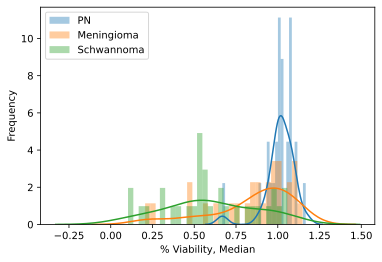

In [25]:
sns.distplot(merged_data[(merged_data.condition == 'pNF')].loc[:, 'median'], bins = 30);
sns.distplot(merged_data[(merged_data.condition == 'meningioma')].loc[:, 'median'], bins = 30);
sns.distplot(merged_data[(merged_data.condition == 'schwannoma')].loc[:, 'median'], bins = 30);
plt.legend(['PN', 'Meningioma', 'Schwannoma']);
plt.xlabel('% Viability, Median');
plt.ylabel('Frequency');

plt.savefig("../images/Fig4.png", dpi=410);

### Compare stopwords using wordcloud

#### Original stopword dictionary plus no +/- 10 words

In [26]:
stop_words = set(stopwords.words('english'))

temp = abstracts['abstract_norm'].apply(lambda x : nltk.word_tokenize(x))
stopword_test = temp.apply(lambda x: [word for word in x if word not in stop_words])

stopword_test = stopword_test.apply(lambda x: ' '.join(x))

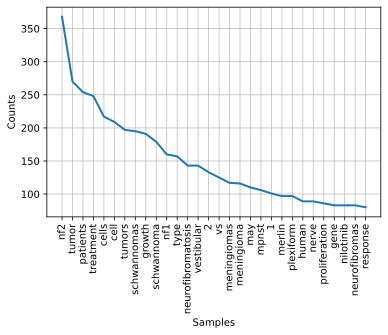

In [27]:
txt = stopword_test.str.replace(r'\|', ' ').str.cat(sep=' ')
words = nltk.tokenize.word_tokenize(txt)
word_dist = nltk.FreqDist(words)

fig = plt.figure(figsize = (6,4))
plt.gcf().subplots_adjust(bottom=0.15) # to avoid x-ticks cut-off

## show 30 most frequent words
word_dist.plot(30,cumulative=False);

plt.show();
fig.savefig("../images/Fig5a1.png", bbox_inches = "tight")

In [28]:
#The top 100 words
rslt = pd.DataFrame(word_dist.most_common(100), columns=['Word', 'Frequency'])
display(rslt)

,Word,Frequency
0,nf2,368
1,tumor,270
2,patients,254
3,treatment,248
4,cells,217
...,...,...
95,one,44
96,data,43
97,inhibition,42
98,surgery,42


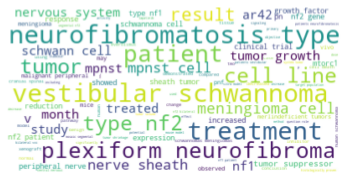

In [29]:
wordcloud = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(txt)
plt.figure();
plt.imshow(wordcloud, interpolation="bilinear");
plt.axis("off");

plt.savefig("../images/Fig5a2.png", dpi=410);
plt.show();

#### Augmented stopword dictionary

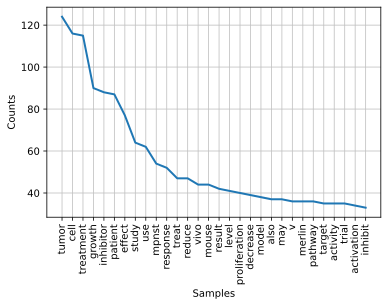

In [30]:
txt = merged_data.words.str.replace(r'\|', ' ').str.cat(sep=' ')
words = nltk.tokenize.word_tokenize(txt)
word_dist = nltk.FreqDist(words)

fig = plt.figure(figsize = (6,4))
plt.gcf().subplots_adjust(bottom=0.15) # to avoid x-ticks cut-off

## show 30 most frequent words
word_dist.plot(30,cumulative=False);

plt.show();
fig.savefig("../images/Fig5b1.png", bbox_inches = "tight")

In [31]:
#The top 100 words
rslt = pd.DataFrame(word_dist.most_common(100), columns=['Word', 'Frequency'])
display(rslt)

,Word,Frequency
0,tumor,124
1,cell,116
2,treatment,115
3,growth,90
4,inhibitor,88
...,...,...
95,schwann,15
96,assess,15
97,4hydroxytamoxifen,15
98,basal,15


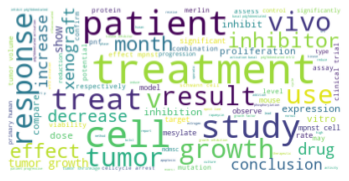

In [32]:
wordcloud = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(txt)
plt.figure();
plt.imshow(wordcloud, interpolation="bilinear");
plt.axis("off");

plt.savefig("../images/Fig5b2.png", dpi=410);
plt.show();

# Split into "training" and "testing" data

In [33]:
train_data = merged_data[merged_data['condition'] != 'pNF']
test_data = merged_data[merged_data['condition'] == 'pNF']

In [34]:
print(train_data.shape)
print(test_data.shape)

(60, 12)
(27, 12)


# Create text representation

In [35]:
def make_bow(train, test, M_set=0.1, bin_set=True):
    #vocab = None
    
    tf_vectorizer_bin = CountVectorizer(binary=bin_set, min_df=M_set)

    tf_train = tf_vectorizer_bin.fit_transform(train)
    tf_feature_names = tf_vectorizer_bin.get_feature_names() #bag of vocabulary
    Train_BoW = tf_train.toarray()
    matrix_train = pd.DataFrame(Train_BoW, columns=list(tf_feature_names))

    tf_test = tf_vectorizer_bin.transform(test)
    Test_BoW = tf_test.toarray()
    matrix_test = pd.DataFrame(Test_BoW, columns=list(tf_feature_names))

    return matrix_train, matrix_test, tf_feature_names

Adapted from [here](https://towardsdatascience.com/pca-using-python-scikit-learn-e653f8989e60)

In [36]:
def run_pca(input_mx, target_vx, pc=2):
    
    pca = PCA(n_components=pc)
    
    principalComponents = pca.fit_transform(input_mx)

    pc_labels = ['PC'+str(i) for i in range(1, pc+1)]
    df_pca = pd.DataFrame(data = principalComponents,
                          columns = pc_labels)
    df_pca.reset_index(drop=True, inplace=True)

    target = target_vx
    target.reset_index(drop=True, inplace=True)

    df_pca = pd.concat([df_pca, target], axis = 1)
    
    return df_pca

## Bag-of-words: binary matrix

In [37]:
m_list = [0.01, 0.025, 0.05, 0.075, 0.1]

PC1_train_list = []
PC2_train_list = []
PC3_train_list = []
train_med_list = []

PC1_test_list = []
PC2_test_list = []
PC3_test_list = []
test_med_list = []

## create lists of PCs given different M values
for m in m_list:

    ## features not in use here
    matrix_train_count, matrix_test_count, features = make_bow(train_data['words'], test_data['words'], 
                                                               M_set = m, bin_set = True)
    
    df_pca_train = run_pca(matrix_train_count, train_data[['median']], pc=3)
    df_pca_test = run_pca(matrix_test_count, test_data[['median']], pc=3)
    
    PC1_train_list.extend(df_pca_train.PC1)
    PC2_train_list.extend(df_pca_train.PC2)
    PC3_train_list.extend(df_pca_train.PC3)
    train_med_list.extend(df_pca_train['median'])

    PC1_test_list.extend(df_pca_test.PC1)
    PC2_test_list.extend(df_pca_test.PC2)
    PC3_test_list.extend(df_pca_test.PC3)
    test_med_list.extend(df_pca_test['median'])

## create dataframes for training data
m_labs_train = [[i]*len(train_data[['median']]) for i in m_list]
m_labs_train = [item for sublist in m_labs_train for item in sublist]

df_pca_train = pd.DataFrame(data = {'PC1': PC1_train_list, 
                                    'PC2': PC2_train_list,
                                    'PC3': PC3_train_list,
                                    'median': train_med_list,
                                    'M': m_labs_train})
df_pca_train.reset_index(drop=True, inplace=True)

## create dataframes for testing data
m_labs_test = [[i]*len(test_data[['median']]) for i in m_list]
m_labs_test = [item for sublist in m_labs_test for item in sublist]

df_pca_test = pd.DataFrame(data = {'PC1': PC1_test_list, 
                                   'PC2': PC2_test_list, 
                                   'PC3': PC3_test_list, 
                                   'median': test_med_list,
                                   'M': m_labs_test})
df_pca_test.reset_index(drop=True, inplace=True)

df_pca = pd.concat([df_pca_train, df_pca_test], axis = 0)

df_pca['source'] = ['train']*df_pca_train.shape[0] + ['test']*df_pca_test.shape[0]

Adapted from [here](https://stackoverflow.com/questions/44641669/scatterplot-with-point-colors-representing-a-continuous-variable-in-seaborn-face)

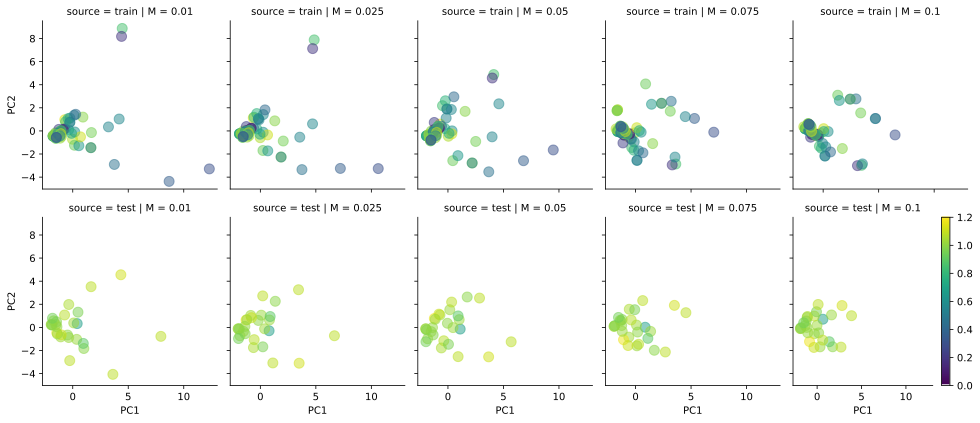

In [38]:
g = sns.FacetGrid(df_pca, row = 'source', col = 'M', palette = 'seismic');

def facet_scatter(x, y, c, **kwargs):
    kwargs.pop("color")
    plt.scatter(x, y, c=c, **kwargs)

vmin, vmax = 0, 1.2
cmap = plt.cm.viridis

norm=plt.Normalize(vmin=vmin, vmax=vmax)

g = g.map(facet_scatter, 'PC1', 'PC2', 'median',
          s=100, alpha=0.5, norm=norm, cmap=cmap)

# Make space for the colorbar
g.fig.subplots_adjust(right=.9)

points = plt.scatter([], [], c=[], vmin=vmin, vmax=vmax, cmap=cmap)
g.fig.colorbar(points)

plt.savefig("../images/Fig6a1.png", dpi=410);
plt.show();

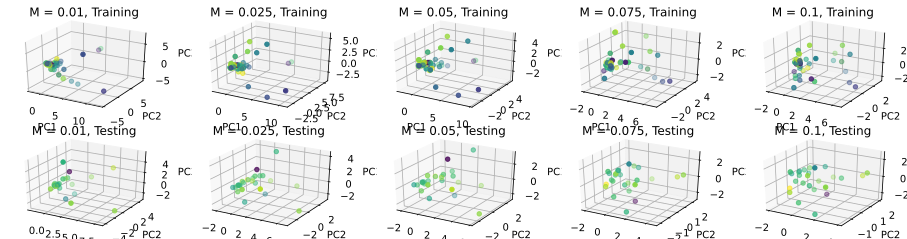

In [39]:
fig = plt.figure(figsize=plt.figaspect(0.25))

for i, j in enumerate(m_list):
    ax = fig.add_subplot(2, len(m_list), i+1, projection='3d')
    
    ax.set_xlabel('PC1')
    ax.set_ylabel('PC2')
    ax.set_zlabel('PC3')
    ax.set_title('M = ' + str(j) + ', Training')

    ax.scatter(df_pca.loc[((df_pca.source == 'train') & (df_pca.M == j)), 'PC1'], 
               df_pca.loc[((df_pca.source == 'train') & (df_pca.M == j)), 'PC2'],
               df_pca.loc[((df_pca.source == 'train') & (df_pca.M == j)), 'PC3'], 
               c=df_pca.loc[((df_pca.source == 'train') & (df_pca.M == j)), 'median'], 
               marker='o',
               cmap=plt.cm.viridis); 

for i, j in enumerate(m_list):
    ax = fig.add_subplot(2, len(m_list), i+6, projection='3d')
    
    ax.set_xlabel('PC1')
    ax.set_ylabel('PC2')
    ax.set_zlabel('PC3')
    ax.set_title('M = ' + str(j) + ', Testing')

    ax.scatter(df_pca.loc[((df_pca.source == 'test') & (df_pca.M == j)), 'PC1'], 
               df_pca.loc[((df_pca.source == 'test') & (df_pca.M == j)), 'PC2'],
               df_pca.loc[((df_pca.source == 'test') & (df_pca.M == j)), 'PC3'], 
               c=df_pca.loc[((df_pca.source == 'test') & (df_pca.M == j)), 'median'], 
               marker='o',
               cmap=plt.cm.viridis); 

plt.savefig("../images/Fig6a2.png", dpi=410);
plt.show();

In [40]:
dist = DistanceMetric.get_metric('euclidean')

for m in m_list:
    df_m = df_pca.loc[((df_pca.M == m) & (df_pca.source == 'train')), ['PC1', 'PC2', 'PC3']]
    df_m = np.array(df_m)
    mx_dist_bin = dist.pairwise(df_m)
    avg = np.mean(np.triu(mx_dist_bin, k = 1))
    sd = np.std(np.triu(mx_dist_bin, k = 1))
    
    print('The average distance for M = ' + str(m) + ' is ' + str(avg))
    print('The standard deviation distance for M = ' + str(m) + ' is ' + str(sd))
    print()

The average distance for M = 0.01 is 1.6649892942451614
The standard deviation distance for M = 0.01 is 3.1091165819127995

The average distance for M = 0.025 is 1.6762834910236106
The standard deviation distance for M = 0.025 is 2.8535287775203653

The average distance for M = 0.05 is 1.6907233930289631
The standard deviation distance for M = 0.05 is 2.5882833615514

The average distance for M = 0.075 is 1.5455754785828282
The standard deviation distance for M = 0.075 is 2.1807137506101144

The average distance for M = 0.1 is 1.4476892032247095
The standard deviation distance for M = 0.1 is 2.088306699672119



In [41]:
matrix_train_bin, matrix_test_bin, features_bin = make_bow(train_data['words'], test_data['words'], 
                                                           M_set = 0.05, bin_set = True)
matrix_train_bin.head(5)

,00001,10,14,20,2011,40,908,achievable,across,activation,...,volumetric,vs,way,weight,well,western,whereas,whether,without,xenograft
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1,0,1,0,0,1,0,0,0,0,1,...,1,1,0,0,0,1,1,0,0,1
2,0,1,0,0,1,0,0,0,0,1,...,1,1,0,1,0,1,0,1,0,1
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0


In [42]:
X_train_bin = matrix_train_bin
X_train_bin['freq'] = list(train_data['Freq'])

X_test_bin = matrix_test_bin
X_test_bin['freq'] = list(test_data['Freq'])

## Bag-of-words: count matrix

In [43]:
m_list = [0.01, 0.025, 0.05, 0.075, 0.1]

PC1_train_list = []
PC2_train_list = []
PC3_train_list = []
train_med_list = []

PC1_test_list = []
PC2_test_list = []
PC3_test_list = []
test_med_list = []

## create lists of PCs given different M values
for m in m_list:

    ## features not in use here
    matrix_train_count, matrix_test_count, features = make_bow(train_data['words'], test_data['words'], 
                                                               M_set = m, bin_set = False)
    
    df_pca_train = run_pca(matrix_train_count, train_data[['median']], pc=3)
    df_pca_test = run_pca(matrix_test_count, test_data[['median']], pc=3)
    
    PC1_train_list.extend(df_pca_train.PC1)
    PC2_train_list.extend(df_pca_train.PC2)
    PC3_train_list.extend(df_pca_train.PC3)
    train_med_list.extend(df_pca_train['median'])

    PC1_test_list.extend(df_pca_test.PC1)
    PC2_test_list.extend(df_pca_test.PC2)
    PC3_test_list.extend(df_pca_test.PC3)
    test_med_list.extend(df_pca_test['median'])

## create dataframes for training data
m_labs_train = [[i]*len(train_data[['median']]) for i in m_list]
m_labs_train = [item for sublist in m_labs_train for item in sublist]

df_pca_train = pd.DataFrame(data = {'PC1': PC1_train_list, 
                                    'PC2': PC2_train_list,
                                    'PC3': PC3_train_list,
                                    'median': train_med_list,
                                    'M': m_labs_train})
df_pca_train.reset_index(drop=True, inplace=True)

## create dataframes for testing data
m_labs_test = [[i]*len(test_data[['median']]) for i in m_list]
m_labs_test = [item for sublist in m_labs_test for item in sublist]

df_pca_test = pd.DataFrame(data = {'PC1': PC1_test_list, 
                                   'PC2': PC2_test_list, 
                                   'PC3': PC3_test_list, 
                                   'median': test_med_list,
                                   'M': m_labs_test})
df_pca_test.reset_index(drop=True, inplace=True)

df_pca = pd.concat([df_pca_train, df_pca_test], axis = 0)

df_pca['source'] = ['train']*df_pca_train.shape[0] + ['test']*df_pca_test.shape[0]

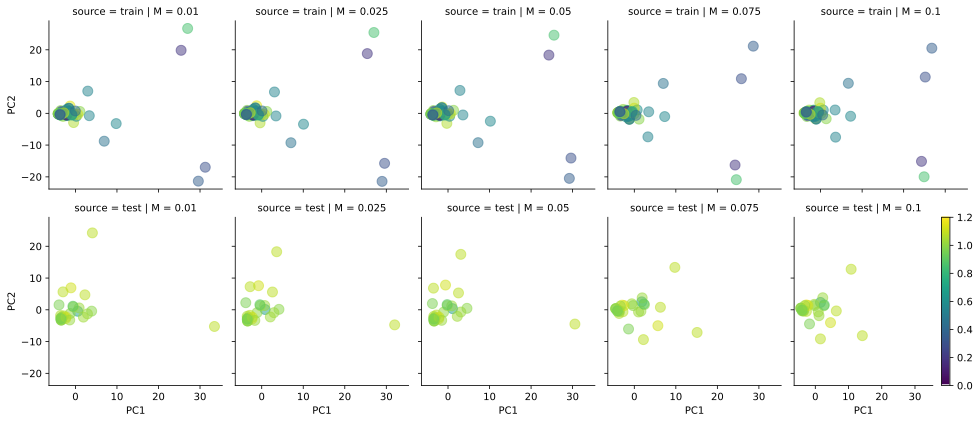

In [44]:
g = sns.FacetGrid(df_pca, row = 'source', col = 'M', palette = 'seismic');

def facet_scatter(x, y, c, **kwargs):
    kwargs.pop("color")
    plt.scatter(x, y, c=c, **kwargs)

vmin, vmax = 0, 1.2
cmap = plt.cm.viridis

norm=plt.Normalize(vmin=vmin, vmax=vmax)

g = g.map(facet_scatter, 'PC1', 'PC2', 'median',
          s=100, alpha=0.5, norm=norm, cmap=cmap)

# Make space for the colorbar
g.fig.subplots_adjust(right=.9)

points = plt.scatter([], [], c=[], vmin=vmin, vmax=vmax, cmap=cmap)
g.fig.colorbar(points)

plt.savefig("../images/Fig6b1.png", dpi=410);
plt.show();

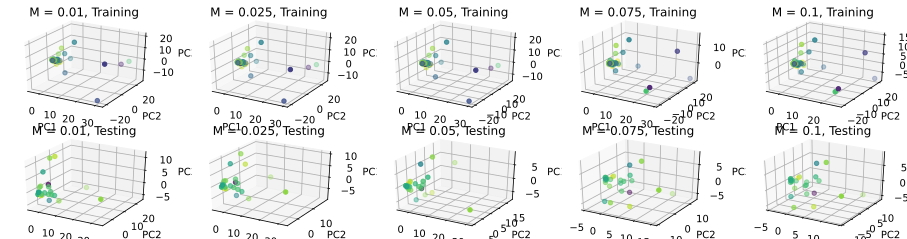

In [45]:
fig = plt.figure(figsize=plt.figaspect(0.25))

for i, j in enumerate(m_list):
    ax = fig.add_subplot(2, len(m_list), i+1, projection='3d')
    
    ax.set_xlabel('PC1')
    ax.set_ylabel('PC2')
    ax.set_zlabel('PC3')
    ax.set_title('M = ' + str(j) + ', Training')

    ax.scatter(df_pca.loc[((df_pca.source == 'train') & (df_pca.M == j)), 'PC1'], 
               df_pca.loc[((df_pca.source == 'train') & (df_pca.M == j)), 'PC2'],
               df_pca.loc[((df_pca.source == 'train') & (df_pca.M == j)), 'PC3'], 
               c=df_pca.loc[((df_pca.source == 'train') & (df_pca.M == j)), 'median'], 
               marker='o',
               cmap=plt.cm.viridis); 

for i, j in enumerate(m_list):
    ax = fig.add_subplot(2, len(m_list), i+6, projection='3d')
    
    ax.set_xlabel('PC1')
    ax.set_ylabel('PC2')
    ax.set_zlabel('PC3')
    ax.set_title('M = ' + str(j) + ', Testing')

    ax.scatter(df_pca.loc[((df_pca.source == 'test') & (df_pca.M == j)), 'PC1'], 
               df_pca.loc[((df_pca.source == 'test') & (df_pca.M == j)), 'PC2'],
               df_pca.loc[((df_pca.source == 'test') & (df_pca.M == j)), 'PC3'], 
               c=df_pca.loc[((df_pca.source == 'test') & (df_pca.M == j)), 'median'], 
               marker='o',
               cmap=plt.cm.viridis); 

plt.savefig("../images/Fig6b2.png", dpi=410);
plt.show();

In [46]:
dist = DistanceMetric.get_metric('euclidean')

for m in m_list:
    df_m = df_pca.loc[((df_pca.M == m) & (df_pca.source == 'train')), ['PC1', 'PC2', 'PC3']]
    df_m = np.array(df_m)
    mx_dist_bin = dist.pairwise(df_m)
    avg = np.mean(np.triu(mx_dist_bin, k = 1))
    sd = np.std(np.triu(mx_dist_bin, k = 1))
    
    print('The average distance for M = ' + str(m) + ' is ' + str(avg))
    print('The standard deviation distance for M = ' + str(m) + ' is ' + str(sd))
    print()

The average distance for M = 0.01 is 4.267897959281668
The standard deviation distance for M = 0.01 is 9.941865383562257

The average distance for M = 0.025 is 4.238358097718487
The standard deviation distance for M = 0.025 is 9.666328010577873

The average distance for M = 0.05 is 4.184160447162683
The standard deviation distance for M = 0.05 is 9.419381224258139

The average distance for M = 0.075 is 3.8730059013992
The standard deviation distance for M = 0.075 is 8.570780844195514

The average distance for M = 0.1 is 3.809321532603673
The standard deviation distance for M = 0.1 is 8.352448082464626



In [47]:
matrix_train_count, matrix_test_count, features_count = make_bow(train_data['words'], test_data['words'],
                                                                 M_set = 0.01, bin_set = False)
matrix_train_count.shape
matrix_train_count.head(5)

,00001,00025,00062,0009,001,0038,005,05,0969,09748,...,whether,wildtype,within,without,would,xenograft,xenograftbearing,xenografts,year,young
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,2,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,4,2,2,0,0
2,0,0,0,0,0,0,0,0,0,0,...,2,2,0,0,1,3,0,2,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [48]:
X_train_count = matrix_train_count
X_train_count['freq'] = list(train_data['Freq'])

X_test_count = matrix_test_count
X_test_count['freq'] = list(test_data['Freq'])

## TF-IDF

In [49]:
#same vocabulary 
vocabulary = features_bin
abstracts_train = train_data.words.tolist()
abstracts_test = test_data.words.tolist()

In [50]:
#Calculate TF-IDF 
def calc_TF(vocab, docs):
    tfDict = {}
    for word in vocab:
        tf_per_word = []
        for doc in docs: 
            length = len(doc.split())
            count = doc.split().count(word)
            freq = (count/length)
            tf_per_word.append(freq)
        tfDict[word] = tf_per_word
    return tfDict
        
def calc_IDF(vocab, docs):
    N = len(docs)
    idfDict = {}
    for word in vocab:
        counts = 0
        for doc in docs:
            if word in (doc.split()):
                counts += 1
        idfDict[word] = np.log(N/(counts+1)) #shouldnt be +1, but a solution online to how testing data might not have that word
    return idfDict
    
def calc_TF_IDF(vocab, docs):
    tfDict = calc_TF(vocab, docs)
    idfDict = calc_IDF(vocab, docs)
    tfidf_values = []
    for word in tfDict.keys():
        tfidf_abstracts = []
        for abst in tfDict[word]:
            tf_idf_score = abst * idfDict[word]
            tfidf_abstracts.append(tf_idf_score)
        tfidf_values.append(tfidf_abstracts)
    return tfidf_values

In [51]:
tfidf_train = calc_TF_IDF(vocabulary, abstracts_train)
tfidf_train_model = np.asarray(tfidf_train)
tfidf_train_model = tfidf_train_model.T
tfidf_train_model.shape

(60, 322)

In [52]:
matrix_train_tfidf = pd.DataFrame(tfidf_train_model)
matrix_train_tfidf.columns = matrix_train_bin.drop(columns='freq').columns
matrix_train_tfidf.head()

,00001,10,14,20,2011,40,908,achievable,across,activation,...,volumetric,vs,way,weight,well,western,whereas,whether,without,xenograft
0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,...,0.000000,0.000000,0.0,0.00000,0.0,0.000000,0.000000,0.00000,0.0,0.115129
1,0.0,0.005916,0.0,0.0,0.012895,0.0,0.0,0.0,0.0,0.012798,...,0.011833,0.009595,0.0,0.00000,0.0,0.011833,0.012895,0.00000,0.0,0.021929
2,0.0,0.006212,0.0,0.0,0.013540,0.0,0.0,0.0,0.0,0.013438,...,0.012425,0.020149,0.0,0.01354,0.0,0.012425,0.000000,0.01354,0.0,0.017269
3,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,...,0.000000,0.000000,0.0,0.00000,0.0,0.000000,0.000000,0.00000,0.0,0.000000
4,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.049089,...,0.000000,0.000000,0.0,0.00000,0.0,0.000000,0.000000,0.00000,0.0,0.000000


In [53]:
tfidf_test = calc_TF_IDF(vocabulary, abstracts_test)
tfidf_test_model = np.asarray(tfidf_test)
tfidf_test_model = tfidf_test_model.T
tfidf_test_model.shape

(27, 322)

In [54]:
matrix_test_tfidf = pd.DataFrame(tfidf_test_model)
matrix_test_tfidf.columns = matrix_test_bin.drop(columns='freq').columns
matrix_test_tfidf.head()

,00001,10,14,20,2011,40,908,achievable,across,activation,...,volumetric,vs,way,weight,well,western,whereas,whether,without,xenograft
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.010227,0.000000,0.0,0.000000,0.000000,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.016684,0.0,0.012241,0.014085,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0


In [55]:
## create dataframes for training data
df_pca_train = run_pca(matrix_train_tfidf, train_data[['median']], pc=3)
df_pca_train.reset_index(drop=True, inplace=True)

## create dataframes for testing data
df_pca_test = run_pca(matrix_test_tfidf, test_data[['median']], pc=3)
df_pca_test.reset_index(drop=True, inplace=True)

df_pca = pd.concat([df_pca_train, df_pca_test], axis = 0)

df_pca['source'] = ['train']*df_pca_train.shape[0] + ['test']*df_pca_test.shape[0]

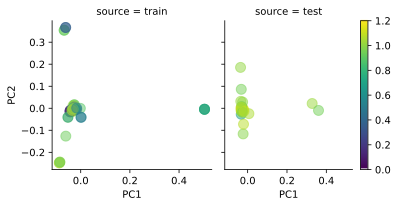

In [56]:
g = sns.FacetGrid(df_pca, col = 'source', palette = 'seismic');

def facet_scatter(x, y, c, **kwargs):
    kwargs.pop("color")
    plt.scatter(x, y, c=c, **kwargs)

vmin, vmax = 0, 1.2
cmap = plt.cm.viridis

norm=plt.Normalize(vmin=vmin, vmax=vmax)

g = g.map(facet_scatter, 'PC1', 'PC2', 'median',
          s=100, alpha=0.5, norm=norm, cmap=cmap)

# Make space for the colorbar
g.fig.subplots_adjust(right=.9)

points = plt.scatter([], [], c=[], vmin=vmin, vmax=vmax, cmap=cmap)
g.fig.colorbar(points)

plt.savefig("../images/Fig6c1.png", dpi=410);
plt.show();

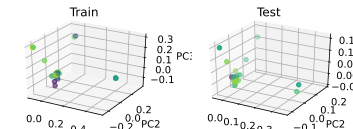

In [57]:
fig = plt.figure(figsize=plt.figaspect(0.1))

for i, j in enumerate(['train', 'test']):
    ax = fig.add_subplot(1, len(m_list), i+1, projection='3d')
    
    ax.set_xlabel('PC1')
    ax.set_ylabel('PC2')
    ax.set_zlabel('PC3')
    ax.set_title(j.capitalize())

    ax.scatter(df_pca.loc[(df_pca.source == j), 'PC1'], 
               df_pca.loc[(df_pca.source == j), 'PC2'],
               df_pca.loc[(df_pca.source == j), 'PC3'], 
               c=df_pca.loc[(df_pca.source == j), 'median'], 
               marker='o',
               cmap=plt.cm.viridis); 

plt.savefig("../images/Fig6c2.png", dpi=410);
plt.show();

In [58]:
X_train_tfidf = matrix_train_tfidf
X_train_tfidf['freq'] = list(train_data['Freq'])

X_test_tfidf = matrix_test_tfidf
X_test_tfidf['freq'] = list(test_data['Freq'])

# Scaling Cell Viability Data

Adapted from [here](https://www.analyticsvidhya.com/blog/2020/03/support-vector-regression-tutorial-for-machine-learning/).  Not going to scale X values since these are binary variables.

In [59]:
y_train_unscaled = train_data['median'].to_numpy()
y_test_unscaled = test_data['median'].to_numpy()

In [60]:
sc_y = StandardScaler()

## run standard scaler on all data (including testing) first
y_scaled = merged_data['median'].to_numpy()
y_scaled = sc_y.fit_transform(y_scaled.reshape(-1, 1))

y_train_scaled = y_scaled[merged_data['condition'] != 'pNF']
y_test_scaled = y_scaled[merged_data['condition'] == 'pNF']

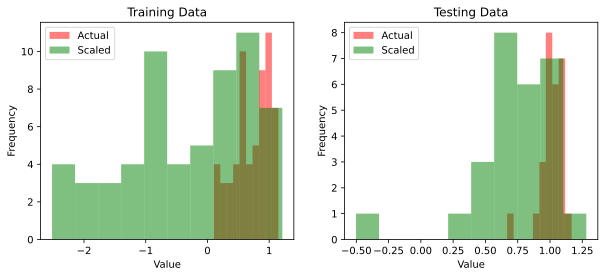

In [61]:
fig = plt.figure(figsize = (10,4))
plt.tight_layout()

plt.subplot(1, 2, 1)
plt.hist(train_data['median'], color = 'red', alpha = 0.5);
plt.hist(y_train_scaled, color = 'green', alpha = 0.5);
plt.title('Training Data');
plt.xlabel('Value');
plt.ylabel('Frequency');
plt.legend(labels = ['Actual', 'Scaled']);

plt.subplot(1, 2, 2)
plt.hist(test_data['median'], color = 'red', alpha = 0.5);
plt.hist(y_test_scaled, color = 'green', alpha = 0.5);
plt.title('Testing Data');
plt.xlabel('Value');
plt.ylabel('Frequency');
plt.legend(labels = ['Actual', 'Scaled']);

plt.savefig("../images/Fig7a.png", dpi=410);

# Linear regression with Lasso regularization 

In [412]:
## set GridSearch and CV parameters

## 5-fold cross-validation on training set
K = 5

## using MSE as score
scorer = make_scorer(mean_squared_error, greater_is_better=False)

## parameters to use for GridSearch
parameters_linreg = [{'alpha': [0, 0.001, 0.01, 0.1, 0.5, 1],
                      'fit_intercept': [True, False], 
                      'normalize': [False],
                      'copy_X': [True, False],
                      'max_iter':[100,500,1000,5000],
                      'tol': [1e-5, 1e-4, 1e-3]}]

In [411]:
## run LinReg using GridSearch optimized parameters
def run_lasso(input_x, input_y, params, score, folds):
    lasso_gs = GridSearchCV(linear_model.Lasso(random_state = seed), params, scoring = score, cv = folds)

    lasso_gs.fit(input_x, input_y)

    print("Best parameters set found on cross-validation:")
    print(lasso_gs.best_params_)
    
    return lasso_gs

## Binary  BoW

In [413]:
random.seed(seed)
np.random.seed(seed)

linreg_bin = run_lasso(X_train_bin, 
                       y_train_scaled, 
                       params=parameters_linreg, 
                       score=scorer,
                       folds=K)

Best parameters set found on cross-validation:
{'alpha': 0.001, 'copy_X': True, 'fit_intercept': True, 'max_iter': 100, 'normalize': False, 'tol': 1e-05}


In [414]:
#Scaled Data
y_pred_linreg_train_bin = linreg_bin.predict(X_train_bin)
y_pred_linreg_train_bin = sc_y.inverse_transform(y_pred_linreg_train_bin) 

y_pred_linreg_test_bin = linreg_bin.predict(X_test_bin)
y_pred_linreg_test_bin = sc_y.inverse_transform(y_pred_linreg_test_bin) 

print('Scaled training MSE: {}'.format(round(mean_squared_error(train_data['median'], y_pred_linreg_train_bin), 6)))
print('Scaled test MSE: {}'.format(round(mean_squared_error(test_data['median'], y_pred_linreg_test_bin), 6)))

Scaled training MSE: 0.004461
Scaled test MSE: 0.086494


## Count BoW

In [415]:
linreg_count = run_lasso(X_train_count, 
                         y_train_scaled, 
                         params=parameters_linreg, 
                         score=scorer,
                         folds=K)

Best parameters set found on cross-validation:
{'alpha': 0.001, 'copy_X': True, 'fit_intercept': True, 'max_iter': 100, 'normalize': False, 'tol': 1e-05}


In [416]:
#Scaled Data
y_pred_linreg_train_count = linreg_count.predict(X_train_count)
y_pred_linreg_train_count = sc_y.inverse_transform(y_pred_linreg_train_count) 

y_pred_linreg_test_count = linreg_count.predict(X_test_count)
y_pred_linreg_test_count = sc_y.inverse_transform(y_pred_linreg_test_count) 

print('Scaled training MSE: {}'.format(round(mean_squared_error(train_data['median'], y_pred_linreg_train_count), 6)))
print('Scaled test MSE: {}'.format(round(mean_squared_error(test_data['median'], y_pred_linreg_test_count), 6)))

Scaled training MSE: 0.004429
Scaled test MSE: 0.168739


## TF-IDF Matrix

In [417]:
linreg_tfidf = run_lasso(X_train_tfidf, 
                         y_train_scaled, 
                         params=parameters_linreg, 
                         score=scorer,
                         folds=K)

Best parameters set found on cross-validation:
{'alpha': 0.001, 'copy_X': True, 'fit_intercept': False, 'max_iter': 1000, 'normalize': False, 'tol': 1e-05}


In [418]:
#Scaled Data
y_pred_linreg_train_tfidf = linreg_tfidf.predict(X_train_tfidf)
y_pred_linreg_train_tfidf = sc_y.inverse_transform(y_pred_linreg_train_tfidf) 

y_pred_linreg_test_tfidf = linreg_tfidf.predict(X_test_tfidf)
y_pred_linreg_test_tfidf = sc_y.inverse_transform(y_pred_linreg_test_tfidf) 

print('Scaled training MSE: {}'.format(round(mean_squared_error(train_data['median'], y_pred_linreg_train_tfidf), 6)))
print('Scaled test MSE: {}'.format(round(mean_squared_error(test_data['median'], y_pred_linreg_test_tfidf), 6)))

Scaled training MSE: 0.013709
Scaled test MSE: 0.123416


## Feature importance inference

In [430]:
def find_coefs(X_input, y_input):

    lasso_model = linear_model.Lasso(alpha=0.001, max_iter=100, 
                                     fit_intercept=False,
                                     tol=1e-05, random_state = seed)

    lasso_model.fit(X_input, y_input)

    feature_list = list(X_input.columns)
    coef_list = list(lasso_model.coef_)

    feature_list = [feature_list[i] for i, j in enumerate(coef_list) if j > 0]
    coef_list = [i for i in coef_list if i > 0]

    return coef_list, feature_list

In [435]:
coef_bin, feature_bin = find_coefs(X_train_bin, y_train_scaled)
coef_count, feature_count = find_coefs(X_train_count, y_train_scaled)
coef_tfidf, feature_tfidf = find_coefs(X_train_tfidf, y_train_scaled)

df1 = pd.DataFrame({'features': feature_bin, 'coef_bin': coef_bin})
df2 = pd.DataFrame({'features': feature_count, 'coef_count': coef_count})
df3 = pd.DataFrame({'features': feature_tfidf, 'coef_tfidf': coef_tfidf})

df_coef = pd.merge(df1, df2, on = 'features', how = 'outer')
df_coef = pd.merge(df_coef, df3, on = 'features', how = 'outer')

# df_coef.to_csv('../assets/coefficients.csv', index=False)

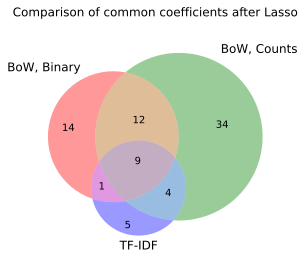

In [419]:
venn3([set(feature_bin), set(feature_count), set(feature_tfidf)], 
      set_labels = ('BoW, Binary', 'BoW, Counts', 'TF-IDF'));

plt.title('Comparison of common coefficients after Lasso\n');
plt.savefig("../images/Fig8.png", dpi=410);

# SVM Model

Adapted from [here](https://stackoverflow.com/questions/48033510/tuning-parameters-for-svm-regression).

In [62]:
## parameters to use for GridSearch
parameters = [{'kernel': ['linear', 'poly', 'sigmoid', 'rbf'], 
               'gamma': ['scale', 'auto', 1e-4, 1e-3, 0.01, 0.1, 0.2, 0.5],
               'C': [1, 10, 100, 1000, 10000]}]

In [63]:
## run SVM using GridSearch optimized parameters
def run_svm(input_x, input_y, params, folds, score, eps = 0.01):
    svr_gs = GridSearchCV(SVR(epsilon = eps), params, cv = folds, scoring = score)

    svr_gs.fit(input_x, input_y.ravel())

    print("Best parameters set found on cross-validation:")
    print(svr_gs.best_params_)
    
    return svr_gs

In [64]:
## create dataframe from svr_gs object to compare performance
def create_dfcv(input_df):
    C = []
    gamma = []
    kernel = []

    for n in input_df.cv_results_['params']:
        C.append(n['C'])
        gamma.append(n['gamma'])
        kernel.append(n['kernel'])

    df_gs = pd.DataFrame({'C': C, 'gamma': gamma, 'kernel': kernel,
                          'MSE': input_df.cv_results_['mean_test_score'],
                          'SD': input_df.cv_results_['std_test_score']})

    df_gs.MSE = df_gs.MSE.apply(lambda x: -x)

    return df_gs

## Binary BoW Matrix

### Scaling cell viability

In [65]:
random.seed(seed)
np.random.seed(seed)

## run model on scaled data
svr_gs_scaled_bin = run_svm(input_x = X_train_bin, 
                            input_y = y_train_scaled, 
                            params = parameters, 
                            folds = K, 
                            score = scorer)

Best parameters set found on cross-validation:
{'C': 100, 'gamma': 'auto', 'kernel': 'rbf'}


In [66]:
y_pred_scaled_train_bin = svr_gs_scaled_bin.predict(X_train_bin)
y_pred_scaled_train_bin = sc_y.inverse_transform(y_pred_scaled_train_bin) 

y_pred_scaled_test_bin = svr_gs_scaled_bin.predict(X_test_bin)
y_pred_scaled_test_bin = sc_y.inverse_transform(y_pred_scaled_test_bin) 

### Not scaling cell viability

In [67]:
random.seed(seed)
np.random.seed(seed)

## run model on unscaled data
svr_gs_unscaled_bin = run_svm(input_x = X_train_bin, 
                              input_y = y_train_unscaled, 
                              params = parameters, 
                              folds = K, 
                              score = scorer)

Best parameters set found on cross-validation:
{'C': 10, 'gamma': 'auto', 'kernel': 'rbf'}


In [68]:
y_pred_unscaled_train_bin = svr_gs_unscaled_bin.predict(X_train_bin)
y_pred_unscaled_test_bin = svr_gs_unscaled_bin.predict(X_test_bin)

### Summary of scaled vs. unscaled data

In [69]:
print('Scaled training MSE: {}'.format(round(mean_squared_error(train_data['median'], y_pred_scaled_train_bin), 6)))
print('Scaled test MSE: {}'.format(round(mean_squared_error(test_data['median'], y_pred_scaled_test_bin), 6)))
print()
print('Unscaled training MSE: {}'.format(round(mean_squared_error(train_data['median'], y_pred_unscaled_train_bin), 6)))
print('Unscaled test MSE: {}'.format(round(mean_squared_error(test_data['median'], y_pred_unscaled_test_bin), 6)))

Scaled training MSE: 0.005823
Scaled test MSE: 0.086236

Unscaled training MSE: 0.00577
Unscaled test MSE: 0.085997


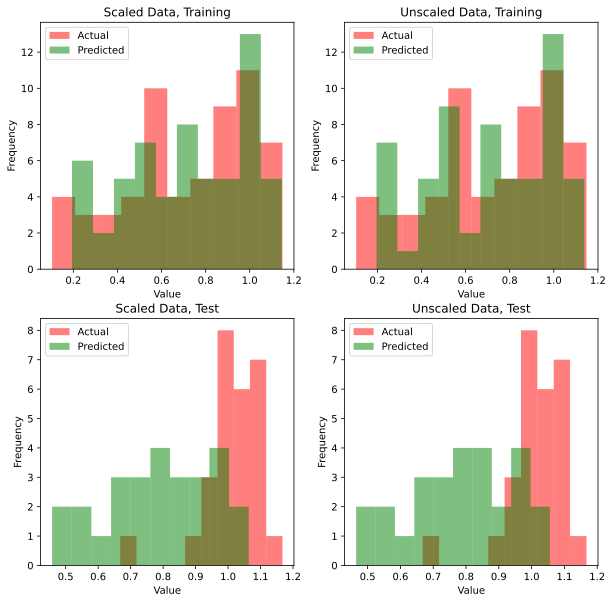

In [70]:
fig = plt.figure(figsize = (10,10))
plt.tight_layout()

plt.subplot(2, 2, 1)
plt.hist(train_data['median'], color = 'red', alpha = 0.5);
plt.hist(y_pred_scaled_train_bin, color = 'green', alpha = 0.5);
plt.title('Scaled Data, Training');
plt.xlabel('Value');
plt.ylabel('Frequency');
plt.legend(labels = ['Actual', 'Predicted']);

plt.subplot(2, 2, 2)
plt.hist(train_data['median'], color = 'red', alpha = 0.5);
plt.hist(y_pred_unscaled_train_bin, color = 'green', alpha = 0.5);
plt.title('Unscaled Data, Training');
plt.xlabel('Value');
plt.ylabel('Frequency');
plt.legend(labels = ['Actual', 'Predicted']);

plt.subplot(2, 2, 3)
plt.hist(test_data['median'], color = 'red', alpha = 0.5);
plt.hist(y_pred_scaled_test_bin, color = 'green', alpha = 0.5);
plt.title('Scaled Data, Test');
plt.xlabel('Value');
plt.ylabel('Frequency');
plt.legend(labels = ['Actual', 'Predicted']);

plt.subplot(2, 2, 4)
plt.hist(test_data['median'], color = 'red', alpha = 0.5);
plt.hist(y_pred_unscaled_test_bin, color = 'green', alpha = 0.5);
plt.title('Unscaled Data, Test');
plt.xlabel('Value');
plt.ylabel('Frequency');
plt.legend(labels = ['Actual', 'Predicted']);

plt.savefig("../images/Fig7b.png", dpi=410);

### Assessing performance across parameters

In [71]:
df_gs_svr_bin = create_dfcv(svr_gs_scaled_bin)

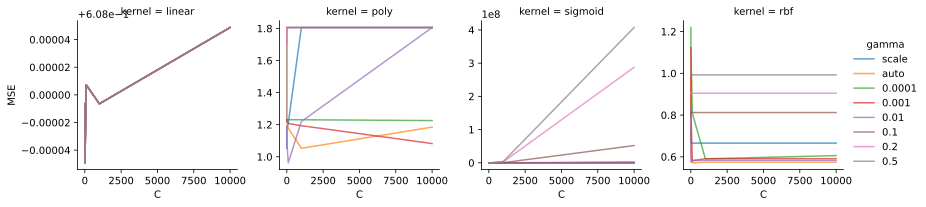

In [72]:
g = sns.FacetGrid(df_gs_svr_bin, col = 'kernel', hue = 'gamma', sharey = False);
g.map(sns.lineplot, 'C', 'MSE', alpha=.7);
g.add_legend();
g.savefig("../images/Fig8a.png", bbox_inches = "tight");

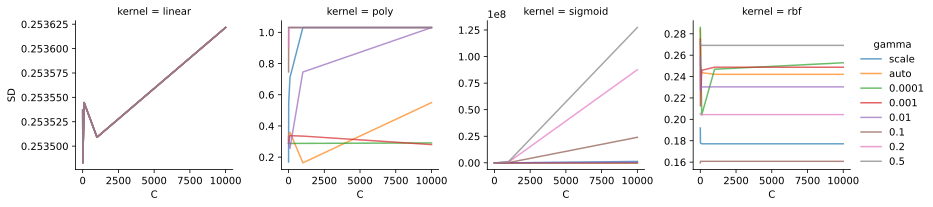

In [73]:
g = sns.FacetGrid(df_gs_svr_bin, col = 'kernel', hue = 'gamma', sharey = False);
g.map(sns.lineplot, 'C', 'SD', alpha=.7);
g.add_legend();
g.savefig("../images/Fig8b.png", bbox_inches = "tight");

## Count BoW Matrix

### Scaling cell viability

In [74]:
random.seed(seed)
np.random.seed(seed)

## run model on scaled data
svr_gs_scaled_count = run_svm(input_x = X_train_count, 
                              input_y = y_train_scaled, 
                              params = parameters, 
                              folds = K, 
                              score = scorer)

Best parameters set found on cross-validation:
{'C': 100, 'gamma': 'auto', 'kernel': 'rbf'}


In [75]:
y_pred_scaled_train_count = svr_gs_scaled_count.predict(X_train_count)
y_pred_scaled_train_count = sc_y.inverse_transform(y_pred_scaled_train_count) 

y_pred_scaled_test_count = svr_gs_scaled_count.predict(X_test_count)
y_pred_scaled_test_count = sc_y.inverse_transform(y_pred_scaled_test_count) 

### Not scaling cell viability

In [76]:
random.seed(seed)
np.random.seed(seed)

## run model on unscaled data
svr_gs_unscaled_count = run_svm(input_x = X_train_count, 
                                input_y = y_train_unscaled, 
                                params = parameters, 
                                folds = K, 
                                score = scorer)

Best parameters set found on cross-validation:
{'C': 10, 'gamma': 'auto', 'kernel': 'rbf'}


In [77]:
y_pred_unscaled_train_count = svr_gs_unscaled_count.predict(X_train_count)
y_pred_unscaled_test_count = svr_gs_unscaled_count.predict(X_test_count)

### Summary of scaled vs. unscaled data

In [78]:
print('Scaled training MSE: {}'.format(round(mean_squared_error(train_data['median'], y_pred_scaled_train_count), 6)))
print('Scaled test MSE: {}'.format(round(mean_squared_error(test_data['median'], y_pred_scaled_test_count), 6)))
print()
print('Unscaled training MSE: {}'.format(round(mean_squared_error(train_data['median'], y_pred_unscaled_train_count), 6)))
print('Unscaled test MSE: {}'.format(round(mean_squared_error(test_data['median'], y_pred_unscaled_test_count), 6)))

Scaled training MSE: 0.005356
Scaled test MSE: 0.117588

Unscaled training MSE: 0.007507
Unscaled test MSE: 0.10732


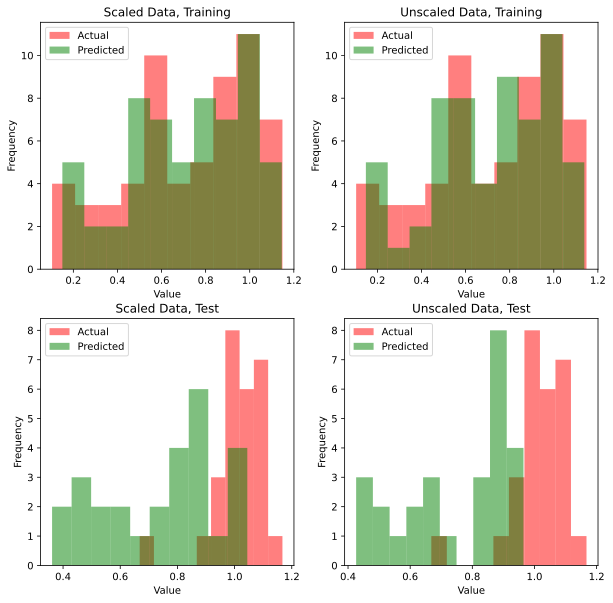

In [79]:
fig = plt.figure(figsize = (10,10))
plt.tight_layout()

plt.subplot(2, 2, 1)
plt.hist(train_data['median'], color = 'red', alpha = 0.5);
plt.hist(y_pred_scaled_train_count, color = 'green', alpha = 0.5);
plt.title('Scaled Data, Training');
plt.xlabel('Value');
plt.ylabel('Frequency');
plt.legend(labels = ['Actual', 'Predicted']);

plt.subplot(2, 2, 2)
plt.hist(train_data['median'], color = 'red', alpha = 0.5);
plt.hist(y_pred_unscaled_train_count, color = 'green', alpha = 0.5);
plt.title('Unscaled Data, Training');
plt.xlabel('Value');
plt.ylabel('Frequency');
plt.legend(labels = ['Actual', 'Predicted']);

plt.subplot(2, 2, 3)
plt.hist(test_data['median'], color = 'red', alpha = 0.5);
plt.hist(y_pred_scaled_test_count, color = 'green', alpha = 0.5);
plt.title('Scaled Data, Test');
plt.xlabel('Value');
plt.ylabel('Frequency');
plt.legend(labels = ['Actual', 'Predicted']);

plt.subplot(2, 2, 4)
plt.hist(test_data['median'], color = 'red', alpha = 0.5);
plt.hist(y_pred_unscaled_test_count, color = 'green', alpha = 0.5);
plt.title('Unscaled Data, Test');
plt.xlabel('Value');
plt.ylabel('Frequency');
plt.legend(labels = ['Actual', 'Predicted']);

plt.savefig("../images/Fig7b2.png", dpi=410);

### Assessing performance across parameters

In [80]:
df_gs_svr_count = create_dfcv(svr_gs_scaled_count)

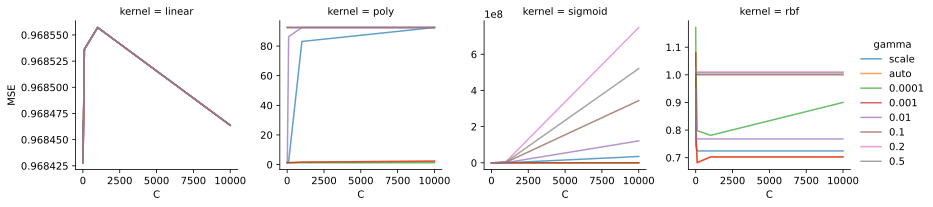

In [81]:
g = sns.FacetGrid(df_gs_svr_count, col = 'kernel', hue = 'gamma', sharey = False);
g.map(sns.lineplot, 'C', 'MSE', alpha=.7);
g.add_legend();
g.savefig("../images/Fig8a2.png", bbox_inches = "tight");

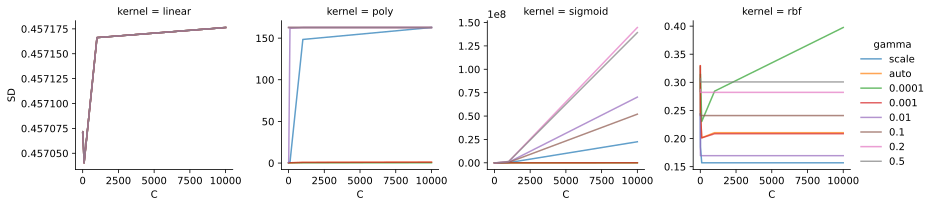

In [82]:
g = sns.FacetGrid(df_gs_svr_count, col = 'kernel', hue = 'gamma', sharey = False);
g.map(sns.lineplot, 'C', 'SD', alpha=.7);
g.add_legend();
g.savefig("../images/Fig8b2.png", bbox_inches = "tight");

## TF-IDF Matrix

### Scaling cell viability

In [83]:
random.seed(seed)
np.random.seed(seed)

## run model on scaled data
svr_gs_scaled_tfidf = run_svm(input_x = X_train_tfidf, 
                              input_y = y_train_scaled, 
                              params = parameters, 
                              folds = K, 
                              score = scorer)

Best parameters set found on cross-validation:
{'C': 10000, 'gamma': 0.001, 'kernel': 'sigmoid'}


In [84]:
y_pred_scaled_train_tfidf = svr_gs_scaled_tfidf.predict(X_train_tfidf)
y_pred_scaled_train_tfidf = sc_y.inverse_transform(y_pred_scaled_train_tfidf) 

y_pred_scaled_test_tfidf = svr_gs_scaled_tfidf.predict(X_test_tfidf)
y_pred_scaled_test_tfidf = sc_y.inverse_transform(y_pred_scaled_test_tfidf) 

### Not scaling cell viability

In [85]:
random.seed(seed)
np.random.seed(seed)

## run model on unscaled data
svr_gs_unscaled_tfidf = run_svm(input_x = X_train_tfidf,
                                input_y = y_train_unscaled, 
                                params = parameters, 
                                folds = K, 
                                score = scorer)

Best parameters set found on cross-validation:
{'C': 10000, 'gamma': 0.0001, 'kernel': 'rbf'}


In [86]:
y_pred_unscaled_train_tfidf = svr_gs_unscaled_tfidf.predict(X_train_tfidf)
y_pred_unscaled_test_tfidf = svr_gs_unscaled_tfidf.predict(X_test_tfidf)

### Summary of scaled vs. unscaled data

In [87]:
print('Scaled training MSE: {}'.format(round(mean_squared_error(train_data['median'], y_pred_scaled_train_tfidf), 6)))
print('Scaled test MSE: {}'.format(round(mean_squared_error(test_data['median'], y_pred_scaled_test_tfidf), 6)))
print()
print('Unscaled training MSE: {}'.format(round(mean_squared_error(train_data['median'], y_pred_unscaled_train_tfidf), 6)))
print('Unscaled test MSE: {}'.format(round(mean_squared_error(test_data['median'], y_pred_unscaled_test_tfidf), 6)))

Scaled training MSE: 0.021364
Scaled test MSE: 0.083281

Unscaled training MSE: 0.025598
Unscaled test MSE: 0.094686


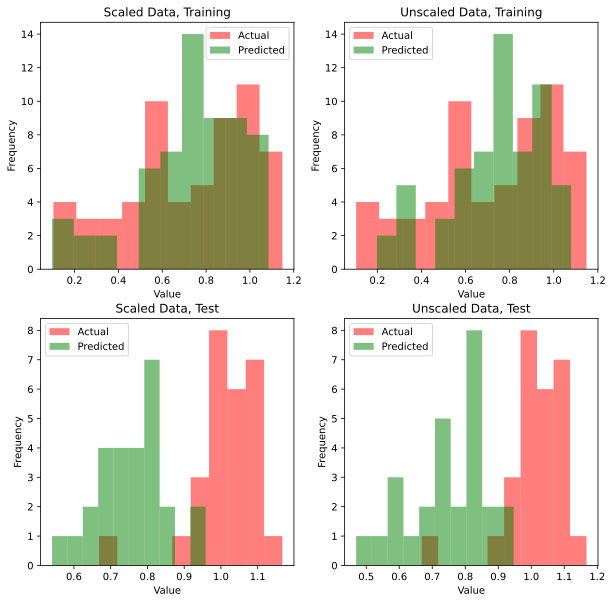

In [88]:
fig = plt.figure(figsize = (10,10))
plt.tight_layout()

plt.subplot(2, 2, 1)
plt.hist(train_data['median'], color = 'red', alpha = 0.5);
plt.hist(y_pred_scaled_train_tfidf, color = 'green', alpha = 0.5);
plt.title('Scaled Data, Training');
plt.xlabel('Value');
plt.ylabel('Frequency');
plt.legend(labels = ['Actual', 'Predicted']);

plt.subplot(2, 2, 2)
plt.hist(train_data['median'], color = 'red', alpha = 0.5);
plt.hist(y_pred_unscaled_train_tfidf, color = 'green', alpha = 0.5);
plt.title('Unscaled Data, Training');
plt.xlabel('Value');
plt.ylabel('Frequency');
plt.legend(labels = ['Actual', 'Predicted']);

plt.subplot(2, 2, 3)
plt.hist(test_data['median'], color = 'red', alpha = 0.5);
plt.hist(y_pred_scaled_test_tfidf, color = 'green', alpha = 0.5);
plt.title('Scaled Data, Test');
plt.xlabel('Value');
plt.ylabel('Frequency');
plt.legend(labels = ['Actual', 'Predicted']);

plt.subplot(2, 2, 4)
plt.hist(test_data['median'], color = 'red', alpha = 0.5);
plt.hist(y_pred_unscaled_test_tfidf, color = 'green', alpha = 0.5);
plt.title('Unscaled Data, Test');
plt.xlabel('Value');
plt.ylabel('Frequency');
plt.legend(labels = ['Actual', 'Predicted']);

plt.savefig("../images/Fig7b3.png", dpi=410);

### Assessing performance across parameters

In [89]:
df_gs_svr_tfidf = create_dfcv(svr_gs_scaled_tfidf)

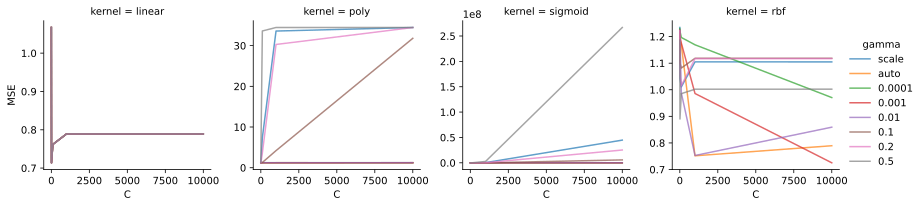

In [90]:
g = sns.FacetGrid(df_gs_svr_tfidf, col = 'kernel', hue = 'gamma', sharey = False);
g.map(sns.lineplot, 'C', 'MSE', alpha=.7);
g.add_legend();
g.savefig("../images/Fig8a3.png", bbox_inches = "tight");

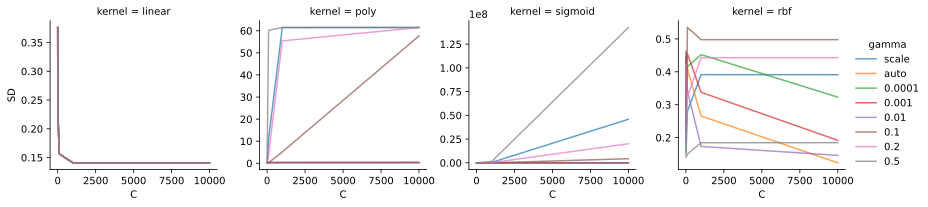

In [91]:
g = sns.FacetGrid(df_gs_svr_tfidf, col = 'kernel', hue = 'gamma', sharey = False);
g.map(sns.lineplot, 'C', 'SD', alpha=.7);
g.add_legend();
g.savefig("../images/Fig8b3.png", bbox_inches = "tight");

# Gradient Boosting

In [92]:
## set GridSearch and CV parameters

## parameters to use for GridSearch
parameters = [{'learning_rate': [0.05, 0.1, 0.25, 0.5, 1], 
               'n_estimators': [10, 100, 500, 1000],
               'subsample': [0.25, 0.50, 0.75, 1.00],
               'max_depth': [2, 3, 5, 10],
               'max_features': ['auto', 'sqrt']}]

In [93]:
## run GBM using GridSearch optimized parameters
def run_gbr(input_x, input_y, params, score, folds):
    gbr_gs = GridSearchCV(GradientBoostingRegressor(random_state=seed), params, scoring = score, cv = folds)

    gbr_gs.fit(input_x, input_y)

    print("Best parameters set found on cross-validation:")
    print(gbr_gs.best_params_)
    
    return gbr_gs

In [94]:
## create dataframe from gbr_gs object to compare performance
def create_dfcv(input_df):
    learning_rate = []
    n_estimators = []
    subsample = []
    max_depth = []
    max_features = []

    for n in input_df.cv_results_['params']:
        learning_rate.append(n['learning_rate'])
        n_estimators.append(n['n_estimators'])
        subsample.append(n['subsample'])
        max_depth.append(n['max_depth'])
        max_features.append(n['max_features'])

    df_gs = pd.DataFrame({'learning_rate': learning_rate, 
                          'n_estimators': n_estimators,
                          'subsample': subsample,
                          'max_depth': max_depth, 
                          'max_features': max_features,
                          'MSE': input_df.cv_results_['mean_test_score'],
                          'SD': input_df.cv_results_['std_test_score']})

    df_gs.MSE = df_gs.MSE.apply(lambda x: -x)

    return df_gs

## Binary BoW Matrix

In [95]:
random.seed(seed)
np.random.seed(seed)

gbr_bin = run_gbr(matrix_train_bin, 
                  y_train_scaled, 
                  params=parameters, 
                  score=scorer,
                  folds=K)

Best parameters set found on cross-validation:
{'learning_rate': 0.05, 'max_depth': 2, 'max_features': 'auto', 'n_estimators': 1000, 'subsample': 0.5}


In [96]:
df_gs_gbr_bin = create_dfcv(gbr_bin)

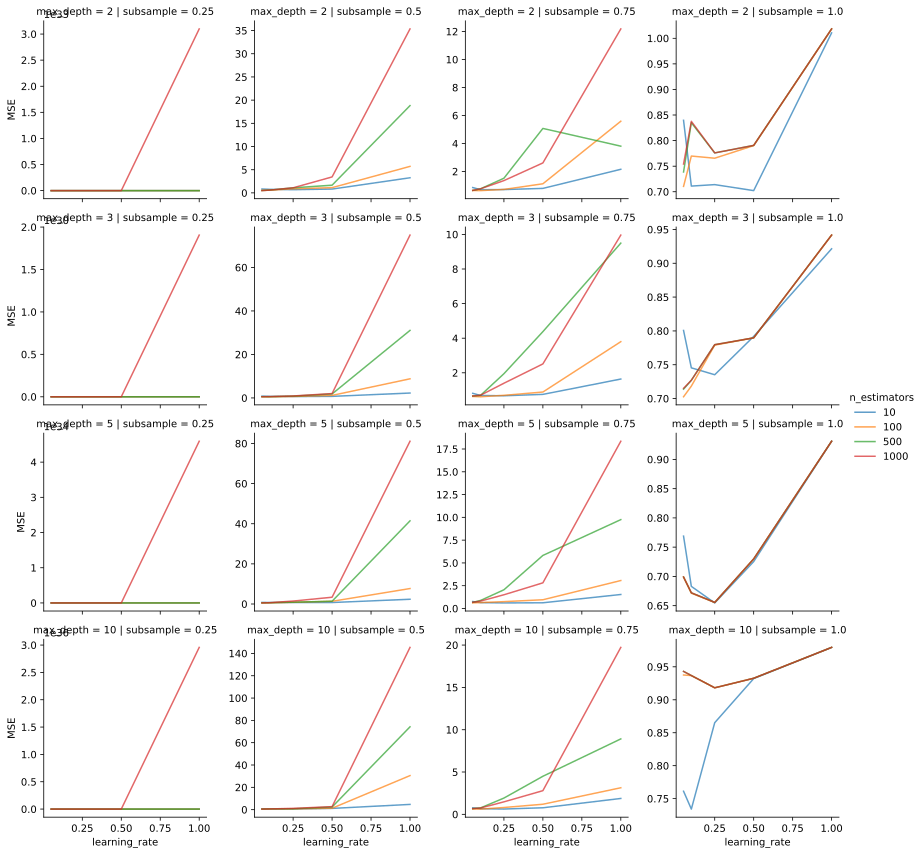

In [97]:
g = sns.FacetGrid(df_gs_gbr_bin.loc[(df_gs_gbr_bin.max_features == 'auto')],
                  row = 'max_depth', col = 'subsample', 
                  hue = 'n_estimators', sharey = False);
g.map(sns.lineplot, 'learning_rate', 'MSE', alpha=.7);
g.add_legend();
g.savefig("../images/Fig11a1.png", bbox_inches = "tight");

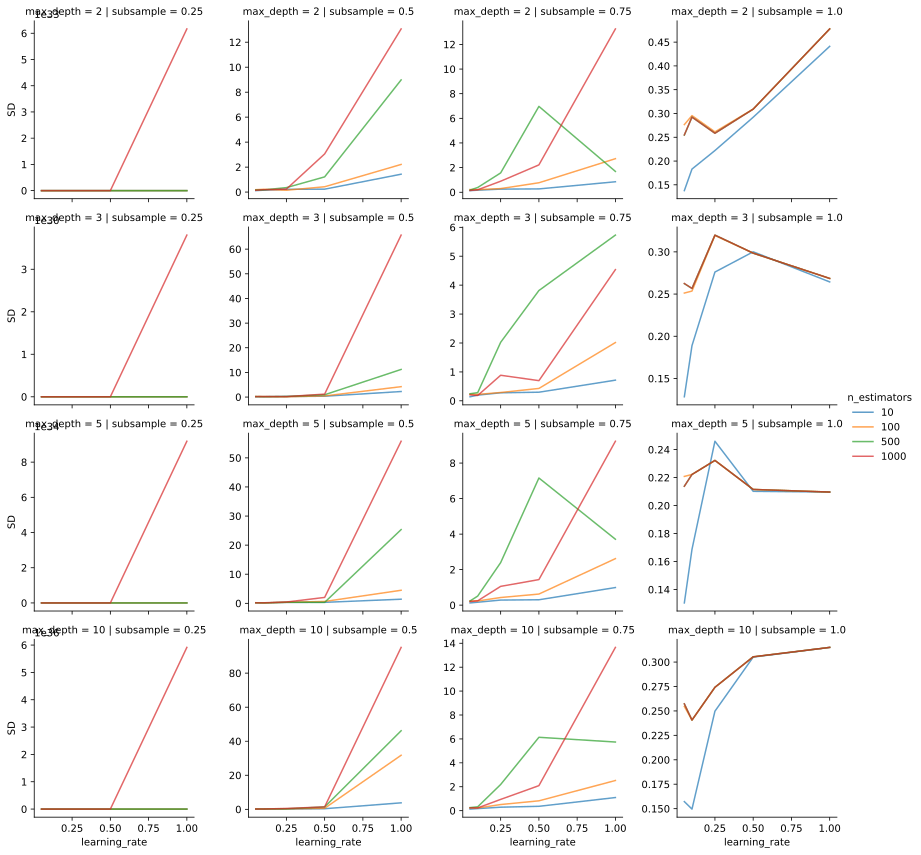

In [98]:
g = sns.FacetGrid(df_gs_gbr_bin.loc[(df_gs_gbr_bin.max_features == 'auto')],
                  row = 'max_depth', col = 'subsample', 
                  hue = 'n_estimators', sharey = False);
g.map(sns.lineplot, 'learning_rate', 'SD', alpha=.7);
g.add_legend();
g.savefig("../images/Fig11b1.png", bbox_inches = "tight");

In [99]:
y_pred_gbr_train_bin = gbr_bin.predict(X_train_bin)
y_pred_gbr_train_bin = sc_y.inverse_transform(y_pred_gbr_train_bin) 

y_pred_gbr_test_bin = gbr_bin.predict(X_test_bin)
y_pred_gbr_test_bin = sc_y.inverse_transform(y_pred_gbr_test_bin) 

In [100]:
print('Training MSE: {}'.format(round(mean_squared_error(train_data['median'], y_pred_gbr_train_bin), 6)))
print('Test MSE: {}'.format(round(mean_squared_error(test_data['median'], y_pred_gbr_test_bin), 6)))

Training MSE: 0.004813
Test MSE: 0.096419


## Count BoW Matrix

In [101]:
random.seed(seed)
np.random.seed(seed)

gbr_count = run_gbr(matrix_train_count, 
                    y_train_scaled, 
                    params=parameters, 
                    score=scorer,
                    folds=K)

Best parameters set found on cross-validation:
{'learning_rate': 0.05, 'max_depth': 3, 'max_features': 'auto', 'n_estimators': 500, 'subsample': 0.5}


In [102]:
df_gs_gbr_count = create_dfcv(gbr_count)

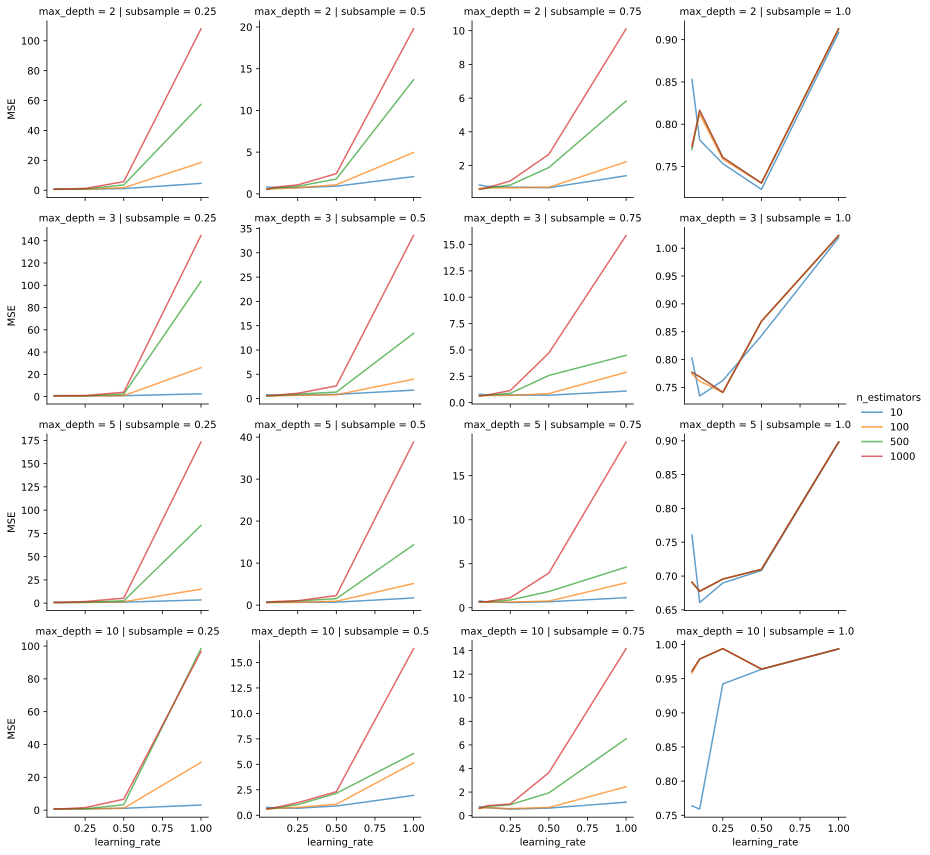

In [103]:
g = sns.FacetGrid(df_gs_gbr_count.loc[(df_gs_gbr_count.max_features == 'auto')],
                  row = 'max_depth', col = 'subsample', 
                  hue = 'n_estimators', sharey = False);
g.map(sns.lineplot, 'learning_rate', 'MSE', alpha=.7);
g.add_legend();
g.savefig("../images/Fig11a2.png", bbox_inches = "tight");

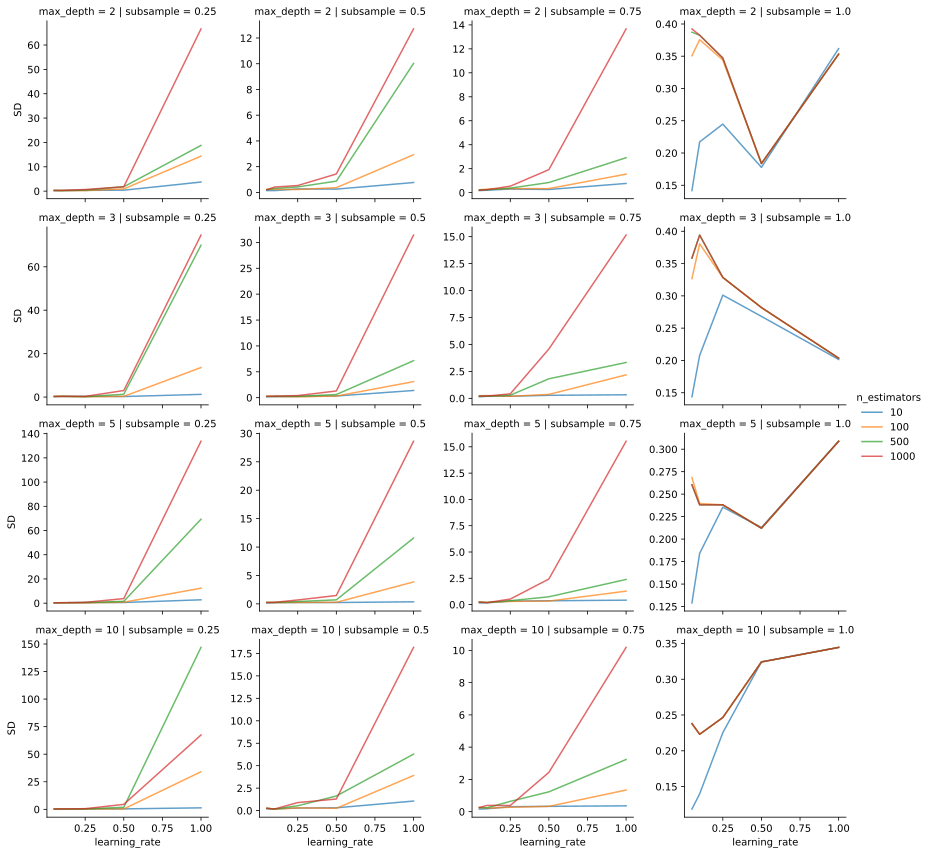

In [104]:
g = sns.FacetGrid(df_gs_gbr_count.loc[(df_gs_gbr_count.max_features == 'auto')],
                  row = 'max_depth', col = 'subsample', 
                  hue = 'n_estimators', sharey = False);
g.map(sns.lineplot, 'learning_rate', 'SD', alpha=.7);
g.add_legend();
g.savefig("../images/Fig11b2.png", bbox_inches = "tight");

In [105]:
y_pred_gbr_train_count = gbr_count.predict(X_train_count)
y_pred_gbr_train_count = sc_y.inverse_transform(y_pred_gbr_train_count) 

y_pred_gbr_test_count = gbr_count.predict(X_test_count)
y_pred_gbr_test_count = sc_y.inverse_transform(y_pred_gbr_test_count) 

In [106]:
print('Training MSE: {}'.format(round(mean_squared_error(train_data['median'], y_pred_gbr_train_count), 6)))
print('Test MSE: {}'.format(round(mean_squared_error(test_data['median'], y_pred_gbr_test_count), 6)))

Training MSE: 0.004714
Test MSE: 0.106614


## TF-IDF Matrix

In [107]:
random.seed(seed)
np.random.seed(seed)

gbr_tfidf = run_gbr(matrix_train_tfidf, 
                    y_train_scaled, 
                    params=parameters, 
                    score=scorer,
                    folds=K)

Best parameters set found on cross-validation:
{'learning_rate': 0.1, 'max_depth': 3, 'max_features': 'auto', 'n_estimators': 500, 'subsample': 0.5}


In [108]:
df_gs_gbr_tfidif = create_dfcv(gbr_tfidf)

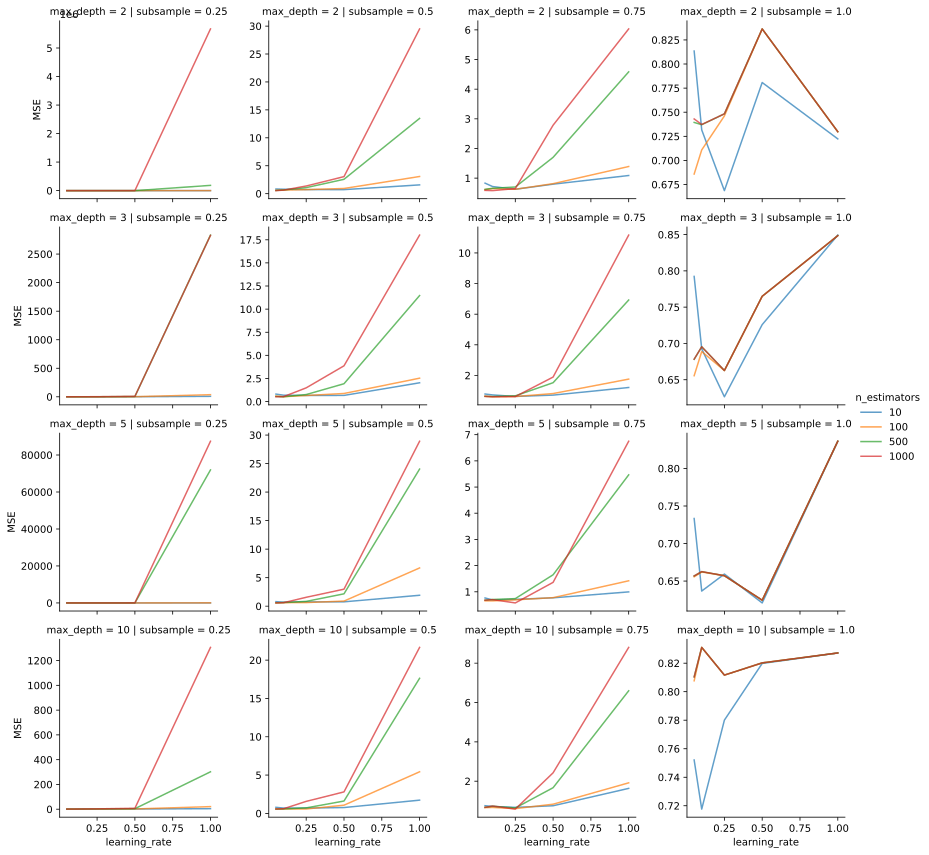

In [109]:
g = sns.FacetGrid(df_gs_gbr_tfidif.loc[(df_gs_gbr_tfidif.max_features == 'auto')],
                  row = 'max_depth', col = 'subsample', 
                  hue = 'n_estimators', sharey = False);
g.map(sns.lineplot, 'learning_rate', 'MSE', alpha=.7);
g.add_legend();
g.savefig("../images/Fig11a3.png", bbox_inches = "tight");

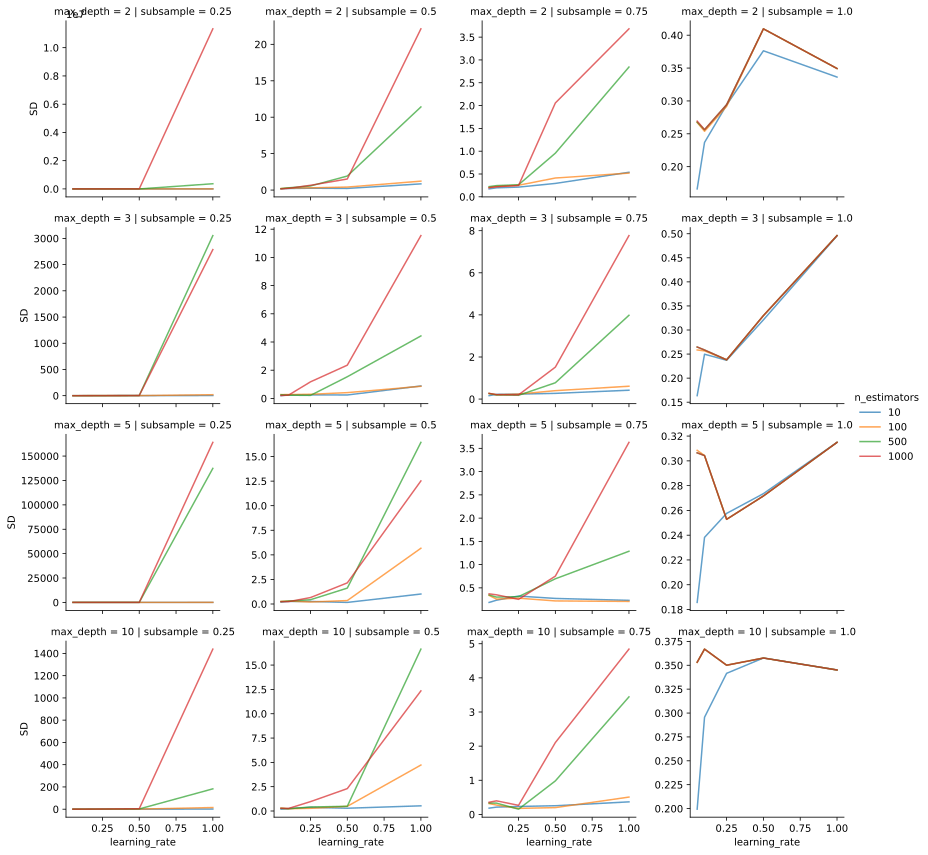

In [110]:
g = sns.FacetGrid(df_gs_gbr_tfidif.loc[(df_gs_gbr_tfidif.max_features == 'auto')],
                  row = 'max_depth', col = 'subsample', 
                  hue = 'n_estimators', sharey = False);
g.map(sns.lineplot, 'learning_rate', 'SD', alpha=.7);
g.add_legend();
g.savefig("../images/Fig11b3.png", bbox_inches = "tight");

In [111]:
y_pred_gbr_train_tfidf = gbr_tfidf.predict(X_train_tfidf)
y_pred_gbr_train_tfidf = sc_y.inverse_transform(y_pred_gbr_train_tfidf) 

y_pred_gbr_test_tfidf = gbr_tfidf.predict(X_test_tfidf)
y_pred_gbr_test_tfidf = sc_y.inverse_transform(y_pred_gbr_test_tfidf) 

In [112]:
print('Training MSE: {}'.format(round(mean_squared_error(train_data['median'], y_pred_gbr_train_tfidf), 6)))
print('Test MSE: {}'.format(round(mean_squared_error(test_data['median'], y_pred_gbr_test_tfidf), 6)))

Training MSE: 0.004869
Test MSE: 0.096802


# Compare all methods

In [436]:
df_combo = pd.DataFrame({'Model': ['Lasso']*3 + ['Support Vector']*3 + ['Gradient Boosted']*3,
                         'Matrix': ['BoW, Binary', 'BoW, Count', 'TF-IDF']*3,
                         'MSE_train': [round(mean_squared_error(train_data['median'], y_pred_linreg_train_bin), 6),
                                       round(mean_squared_error(train_data['median'], y_pred_linreg_train_count), 6),
                                       round(mean_squared_error(train_data['median'], y_pred_linreg_train_tfidf), 6),
                                       round(mean_squared_error(train_data['median'], y_pred_scaled_train_bin), 6),
                                       round(mean_squared_error(train_data['median'], y_pred_scaled_train_count), 6),
                                       round(mean_squared_error(train_data['median'], y_pred_scaled_train_tfidf), 6),
                                       round(mean_squared_error(train_data['median'], y_pred_gbr_train_bin), 6),
                                       round(mean_squared_error(train_data['median'], y_pred_gbr_train_count), 6),
                                       round(mean_squared_error(train_data['median'], y_pred_gbr_train_tfidf), 6)],
                         'MSE_test': [round(mean_squared_error(test_data['median'], y_pred_linreg_test_bin), 6),
                                      round(mean_squared_error(test_data['median'], y_pred_linreg_test_count), 6),
                                      round(mean_squared_error(test_data['median'], y_pred_linreg_test_tfidf), 6),
                                      round(mean_squared_error(test_data['median'], y_pred_scaled_test_bin), 6), 
                                      round(mean_squared_error(test_data['median'], y_pred_scaled_test_count), 6),
                                      round(mean_squared_error(test_data['median'], y_pred_scaled_test_tfidf), 6),
                                      round(mean_squared_error(test_data['median'], y_pred_gbr_test_bin), 6), 
                                      round(mean_squared_error(test_data['median'], y_pred_gbr_test_count), 6),
                                      round(mean_squared_error(test_data['median'], y_pred_gbr_test_tfidf), 6)]})

In [437]:
df_combo

,Model,Matrix,MSE_train,MSE_test
0,Lasso,"BoW, Binary",0.004461,0.086494
1,Lasso,"BoW, Count",0.004429,0.168739
2,Lasso,TF-IDF,0.013709,0.123416
3,Support Vector,"BoW, Binary",0.005823,0.086236
4,Support Vector,"BoW, Count",0.005356,0.117588
5,Support Vector,TF-IDF,0.021364,0.083281
6,Gradient Boosted,"BoW, Binary",0.004813,0.096419
7,Gradient Boosted,"BoW, Count",0.004714,0.106614
8,Gradient Boosted,TF-IDF,0.004869,0.096802


In [224]:
def extract_best(input_model, fold):
    keys = list(input_model.best_params_.keys())
    best_param = [input_model.best_params_[k] for k in keys]

    ## create dictionary for grid of parameters
    cv_grid = [list(input_model.cv_results_['param_'+i]) for i in keys]
    dict1 = dict(zip(keys, cv_grid))

    ## create dictionary for CV results by fold
    cv_labels = ['split'+str(i)+'_test_score' for i in range(fold)]
    cv_results = [list(input_model.cv_results_[i]) for i in cv_labels]
    dict2 = dict(zip(cv_labels, cv_results))

    ## combine parameters and CV results into dataframe
    dict1.update(dict2)
    df_cv = pd.DataFrame(dict1)

    ## create list of index where best params occur
    idx_list = [(df_cv[j] == best_param[i]) for i, j in enumerate(keys)]
    idx_lists = [idx for sublist in idx_list for idx, item in enumerate(sublist) if item == True]

    counter=collections.Counter(idx_lists)

    ## extract location of index where all best parameters occur
    idx = [i for i, j in enumerate(list(counter.values())) if  j == len(keys)]
    idx = list(counter.keys())[idx[0]]

    df_output = df_cv.iloc[[idx]].reset_index(drop=True)

    return df_output

In [447]:
df_1 = extract_best(linreg_bin, K)
df_2 = extract_best(linreg_count, K)
df_3 = extract_best(linreg_tfidf, K)
df_4 = extract_best(svr_gs_scaled_bin, K)
df_5 = extract_best(svr_gs_scaled_count, K)
df_6 = extract_best(svr_gs_scaled_tfidf, K)
df_7 = extract_best(gbr_bin, K)
df_8 = extract_best(gbr_count, K)
df_9 = extract_best(gbr_tfidf, K)

df_lr = pd.concat([df_1, df_2, df_3])
# df_lr = pd.concat([df_1, df_3])
df_svr = pd.concat([df_4, df_5, df_6])
df_gbr = pd.concat([df_7, df_8, df_9])

col_names = list(df_svr.columns[-K:])
df_cv = pd.concat([df_lr[col_names], df_svr[col_names], df_gbr[col_names]])
df_cv['model'] = ['Lasso']*3 + ['SVR']*3 + ['GBR']*3
# df_cv['model'] = ['LinReg']*2 + ['SVR']*3 + ['GBR']*3
df_cv['source'] = ['BoW, Binary', 'BoW, Count', 'BoW, TF-IDF']*3
# df_cv['source'] = ['BoW, Binary', 'BoW, TF-IDF'] + ['BoW, Binary', 'BoW, Count', 'BoW, TF-IDF']*2

df_cv = pd.melt(df_cv, id_vars = ['model', 'source'])

df_cv.value = df_cv.value.apply(lambda x: -x)

df_cv['combo'] = df_cv['model'] + '; ' + df_cv['source']

df_cv.sort_values(by='combo', ascending=False, inplace=True)

In [442]:
df_cv

,model,source,variable,value,combo
14,SVR,"BoW, TF-IDF",split1_test_score,0.327188,"SVR; BoW, TF-IDF"
23,SVR,"BoW, TF-IDF",split2_test_score,0.617350,"SVR; BoW, TF-IDF"
32,SVR,"BoW, TF-IDF",split3_test_score,0.759470,"SVR; BoW, TF-IDF"
5,SVR,"BoW, TF-IDF",split0_test_score,0.814282,"SVR; BoW, TF-IDF"
41,SVR,"BoW, TF-IDF",split4_test_score,1.018901,"SVR; BoW, TF-IDF"
22,SVR,"BoW, Count",split2_test_score,0.611655,"SVR; BoW, Count"
31,SVR,"BoW, Count",split3_test_score,0.356973,"SVR; BoW, Count"
13,SVR,"BoW, Count",split1_test_score,0.648075,"SVR; BoW, Count"
4,SVR,"BoW, Count",split0_test_score,0.888607,"SVR; BoW, Count"
40,SVR,"BoW, Count",split4_test_score,0.902189,"SVR; BoW, Count"


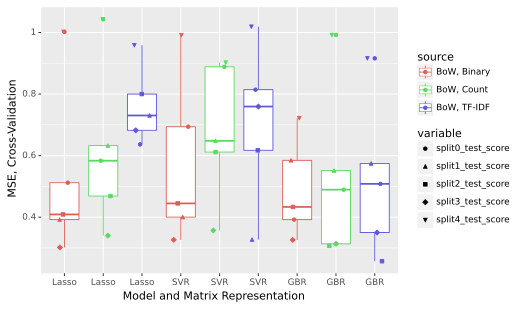

<ggplot: (110188265391)>

In [448]:
from plotnine import ggplot, aes, geom_boxplot, geom_jitter, position_jitter, \
    theme, element_text, xlab, ylab, scale_x_discrete

lab_list = ['Lasso; BoW, Binary', 'Lasso; BoW, Count', 'Lasso; BoW, TF-IDF',
            'SVR; BoW, Binary', 'SVR; BoW, Count', 'SVR; BoW, TF-IDF', 
            'GBR; BoW, Binary', 'GBR; BoW, Count', 'GBR; BoW, TF-IDF']

labs = ['Lasso']*3 + ['SVR']*3 + ['GBR']*3

(
    ggplot(df_cv)  # What data to use
    + geom_boxplot(mapping=aes(x='combo', y='value', color='source'))
    + geom_jitter(mapping=aes(x='combo', y='value', color='source', shape='variable'), 
                  position=position_jitter(0.2))
    + xlab('Model and Matrix Representation')
    + ylab('MSE, Cross-Validation')
    + scale_x_discrete(labels = labs,
                       limits=lab_list)
)

# Assessing Model Performance on Test Data

In [468]:
n_test = test_data.shape[0]

bin_list = list(y_pred_linreg_test_bin.reshape(n_test)) + list(y_pred_scaled_test_bin) + list(y_pred_gbr_test_bin)
count_list = list(y_pred_linreg_test_count.reshape(n_test)) + list(y_pred_scaled_test_count) + list(y_pred_gbr_test_count)
tfidf_list = list(y_pred_linreg_test_tfidf.reshape(n_test)) + list(y_pred_scaled_test_tfidf) + list(y_pred_gbr_test_tfidf)

In [469]:
df_pred = pd.DataFrame({'drug': list(test_data.drug)*3,
                        'y_pred_bin': bin_list,
                        'y_pred_count': count_list,
                        'y_pred_tfidf': tfidf_list,
                        'model': ['Lasso']*n_test + ['SVR']*n_test + ['GBR']*n_test,
                        'y_actual': list(test_data['median'])*3})
df_pred.reset_index(drop=True, inplace=True)

In [470]:
## manually replace those with naming mismatches
df_moa.Drugs[df_moa.Drugs == 'mycophenolatemofetil'] = 'mycophenolate mofetil'
df_moa.Drugs[df_moa.Drugs == 'tamoxifen citrate'] = 'tamoxifen'
df_moa.Drugs[df_moa.Drugs == 'ketotifen fumarate'] = 'ketotifen'
df_moa.Drugs[df_moa.Drugs == 'minocycline hydrochloride'] = 'minocycline'
df_moa.Drugs[df_moa.Drugs == 'tetracycline hydrochloride'] = 'tetracycline'
df_moa.Drugs[df_moa.Drugs == 'trifluoperazine dihydrochloride'] = 'trifluoperazine'

In [471]:
df_pred = df_pred.merge(df_moa.loc[:, ['Drugs', 'moa_final']], 
                        left_on='drug', right_on='Drugs', how='inner')

In [472]:
df_pred.loc[(df_pred.drug == 'octreotide'), 'moa_final'] = 'somatostatin analogue'
df_pred.loc[(df_pred.drug == 'tipifarnib'), 'moa_final'] = 'farnesyltransferase inhibitor'

In [473]:
df_pred.drop(columns='Drugs', inplace=True)

In [474]:
## take the first MOA listed
df_pred['moa_final'] = df_pred['moa_final'].apply(lambda x: x.split(',')[0])

In [475]:
df_pred.moa_final.value_counts()/3

MEK inhibitor                                4.0
bacterial 30S ribosomal subunit inhibitor    3.0
FLT3 inhibitor                               2.0
mTOR inhibitor                               2.0
progesterone receptor agonist                1.0
estrogen receptor antagonist                 1.0
estrogen receptor agonist                    1.0
cyclooxygenase inhibitor                     1.0
histamine receptor agonist                   1.0
Abl kinase inhibitor                         1.0
Bcr-Abl kinase inhibitor                     1.0
androgen receptor agonist                    1.0
HMGCR inhibitor                              1.0
dopamine receptor antagonist                 1.0
tubulin polymerization inhibitor             1.0
topoisomerase inhibitor                      1.0
dehydrogenase inhibitor                      1.0
calcineurin inhibitor                        1.0
Name: moa_final, dtype: float64

AdjustTexts adapted from [here](https://tsinghua-gongjing.github.io/posts/python-plot-tricks.html) and [here](https://stackoverflow.com/questions/34693991/repel-annotations-in-matplotlib).

In [476]:
df_pred = pd.melt(df_pred, id_vars = ['drug', 'y_actual', 'moa_final', 'model'])

df_pred['delta'] = df_pred['y_actual'] - df_pred['value']

df_pred.sort_values(by='delta', ascending=False, inplace=True)

df_pred.variable.loc[(df_pred.variable == 'y_pred_bin')] = 'BoW, Binary'
df_pred.variable.loc[(df_pred.variable == 'y_pred_count')] = 'BoW, Count'
df_pred.variable.loc[(df_pred.variable == 'y_pred_tfidf')] = 'TF-IDF'

Adjust text dictionary adopted from [here](https://stackoverflow.com/questions/57701052/how-do-i-use-adjust-text-with-plotnine).

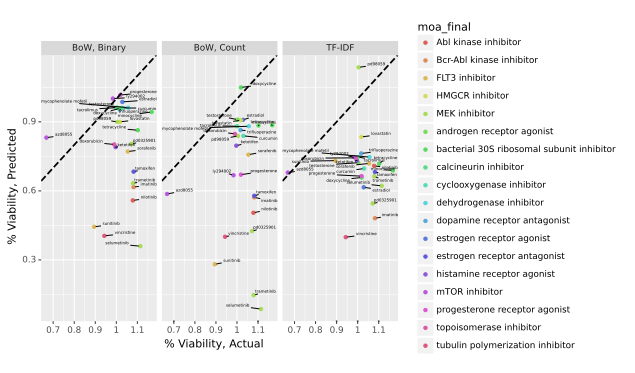

<ggplot: (110189456267)>

In [458]:
from plotnine import ggplot, aes, geom_point, facet_grid, geom_abline, geom_text, xlab, ylab

adjust_text_dict = {
    'expand_points': (2, 2),
    'arrowprops': {
        'arrowstyle': '-',
        'color': 'black'
    }
}

(
    ggplot(df_pred.loc[df_pred.model == 'Lasso'])  # What data to use
    + geom_point(mapping=aes(x='y_actual', y='value', color='moa_final'))  # What variable to use
    + facet_wrap('~variable')  # Geometric object to use for drawing
    + geom_abline(intercept = 0, slope = 1, linetype="dashed", size=1)
    + geom_text(mapping=aes(x='y_actual', y='value', label='drug'),
                nudge_x = 0.1, nudge_y = 0.1, size=4, adjust_text = adjust_text_dict)
    + xlab('% Viability, Actual')
    + ylab('% Viability, Predicted')
)

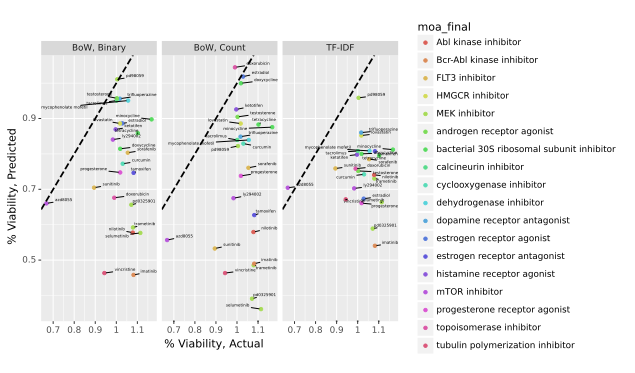

<ggplot: (110059480188)>

In [374]:
from plotnine import ggplot, aes, geom_point, facet_grid, geom_abline, geom_text, xlab, ylab

adjust_text_dict = {
    'expand_points': (2, 2),
    'arrowprops': {
        'arrowstyle': '-',
        'color': 'black'
    }
}

(
    ggplot(df_pred.loc[df_pred.model == 'SVR'])  # What data to use
    + geom_point(mapping=aes(x='y_actual', y='value', color='moa_final'))  # What variable to use
    + facet_wrap('~variable')  # Geometric object to use for drawing
    + geom_abline(intercept = 0, slope = 1, linetype="dashed", size=1)
    + geom_text(mapping=aes(x='y_actual', y='value', label='drug'),
                nudge_x = 0.1, nudge_y = 0.1, size=4, adjust_text = adjust_text_dict)
    + xlab('% Viability, Actual')
    + ylab('% Viability, Predicted')
)

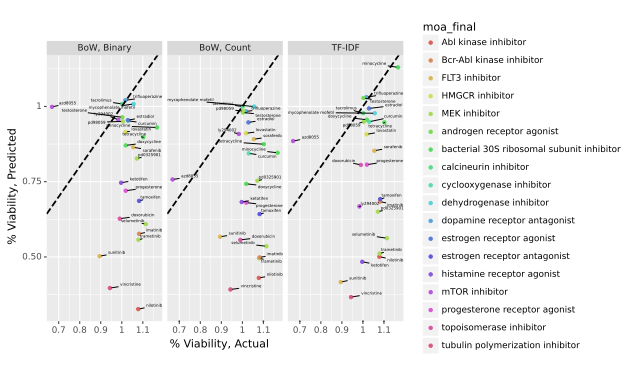

<ggplot: (110059908253)>

In [375]:
from plotnine import ggplot, aes, geom_point, facet_grid, geom_abline, geom_text, xlab, ylab

adjust_text_dict = {
    'expand_points': (2, 2),
    'arrowprops': {
        'arrowstyle': '-',
        'color': 'black'
    }
}

(
    ggplot(df_pred.loc[df_pred.model == 'GBR'])  # What data to use
    + geom_point(mapping=aes(x='y_actual', y='value', color='moa_final'))  # What variable to use
    + facet_wrap('~variable')  # Geometric object to use for drawing
    + geom_abline(intercept = 0, slope = 1, linetype="dashed", size=1)
    + geom_text(mapping=aes(x='y_actual', y='value', label='drug'),
                nudge_x = 0.1, nudge_y = 0.1, size=4, adjust_text = adjust_text_dict)
    + xlab('% Viability, Actual')
    + ylab('% Viability, Predicted')
)

In [477]:
## create another column (idx) reordered by mean by drug
df_temp = pd.DataFrame(df_pred.groupby('drug').delta.mean())
df_temp.sort_values(by='delta', ascending=False, inplace=True)
df_temp.reset_index(drop=False, inplace=True)
df_temp.reset_index(drop=False, inplace=True)
df_temp.drop(columns=['delta'], inplace=True)
df_temp.columns = ['idx', 'drug']
df_temp.idx = df_temp.idx + 1

## merge to add idx column
df_pred = df_pred.merge(df_temp,
                        left_on = "drug",
                        right_on = "drug",
                        how = "left")

## change names of variable column
# df_pred.variable.loc[(df_pred.variable == 'y_pred_bin')] = 'BoW, Binary'
# df_pred.variable.loc[(df_pred.variable == 'y_pred_count')] = 'BoW, Count'
# df_pred.variable.loc[(df_pred.variable == 'y_pred_tfidf')] = 'TF-IDF'

## merge to add freq column
df_pred = df_pred.merge(test_data.loc[:, ['drug', 'Freq']],
                        left_on = "drug",
                        right_on = "drug",
                        how = "left")

## change variable/Freq column names to method/frequency
df_pred.rename(columns={'variable':'method', 'Freq':'frequency'}, inplace=True)

df_pred['Model, Representation'] = df_pred.model + '; ' + df_pred.method

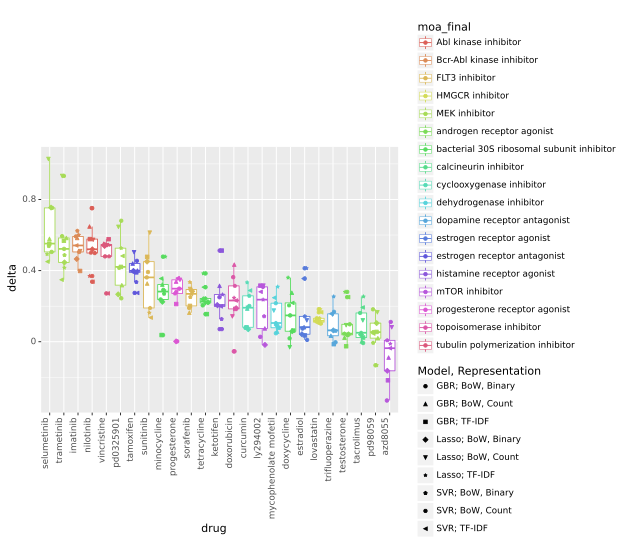

<ggplot: (110061879456)>

In [478]:
from plotnine import ggplot, aes, geom_boxplot, geom_jitter, scale_x_discrete, \
    theme, element_text, position_jitter

(
    ggplot(df_pred)  # What data to use
    + geom_boxplot(mapping=aes(x='drug', y='delta', color='moa_final'))
    + geom_jitter(mapping=aes(x='drug', y='delta', color='moa_final', shape='Model, Representation'), 
                  position=position_jitter(0.2))
    + scale_x_discrete(limits=list(df_temp.drug))
    + theme(axis_text_x=element_text(rotation=90, hjust=1))
)

# NOT IN USE

## Sentiment Analysis

Adopted from [here](https://heartbeat.fritz.ai/evaluating-unsupervised-sentiment-analysis-tools-using-labeled-data-8d4bb1336cee)

https://github.com/watson-developer-cloud/python-sdk/blob/master/examples/natural_language_understanding_v1.py  
https://medium.com/@MissAmaraKay/watson-services-username-password-vs-api-key-1806698316be  
https://cloud.ibm.com/docs/account?topic=account-iamtoken_from_apikey  

In [378]:
## function used to analyze text sentiment from dataframe
# def analyze_text(input_text, analyzer):
#     if analyzer == 'VADER':
#         result = analyzer.polarity_scores(input_text)
#         score = results['compound']
#     else:
#         score = TextBlob(input_text).sentiment.polarity
        
#     if score > 0:
#         result = 1
#     else:
#         result = 0
#     return result

In [ ]:
## IBM-Watson sentiment analyzer
# natural_language_understanding = NaturalLanguageUnderstandingV1(
#     version='2018-03-16')
# natural_language_understanding.set_service_url('https://gateway.watsonplatform.net/natural-language-understanding/api')

### VADER

In [171]:
## VaderSentiment analyzer
analyzer = SentimentIntensityAnalyzer()

In [212]:
vader_series = df_combo['abstract'].apply(SentimentIntensityAnalyzer().polarity_scores)
# df_combo['vader'] = vader_series.apply(lambda x: x['compound'])

In [213]:
vader_series[0]

{'neg': 0.048, 'neu': 0.857, 'pos': 0.095, 'compound': 0.901}

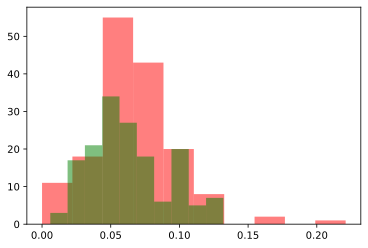

In [214]:
plt.hist(vader_series.apply(lambda x: x['neg']), color = 'red', alpha = 0.5);
plt.hist(vader_series.apply(lambda x: x['pos']), color = 'green', alpha = 0.5);

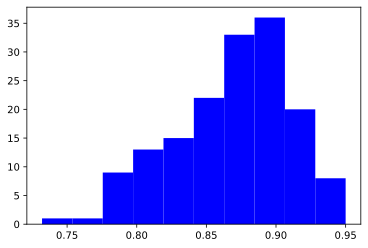

In [215]:
plt.hist(vader_series.apply(lambda x: x['neu']), color = 'blue');

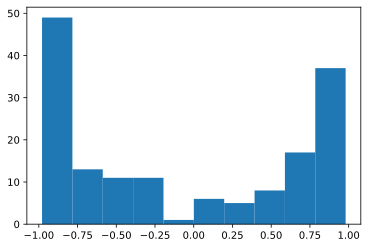

In [216]:
plt.hist(vader_series.apply(lambda x: x['compound']));

### TextBlob for Consensus

In [219]:
textblob_series = df_combo['abstract'].apply(lambda x: TextBlob(x).sentiment.polarity)

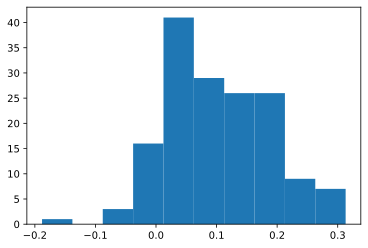

In [220]:
plt.hist(textblob_series);

In [432]:
def compare_sent(vader, textblob):
    if vader*textblob >= 0:
        temp = 1
    else:
        temp = 0
    return temp

### Compare Sentiment Analysis to % Viability

In [274]:
df_melt = df_combo.copy()

scaler = StandardScaler()

df_sent = pd.DataFrame({'vader': vader_series.apply(lambda x: x['compound']),
                       'textblob': textblob_series})

df_sent = scaler.fit_transform(df_sent) 

df_melt['vader'] = df_sent[:, 0]
df_melt['textblob'] = df_sent[:, 1]
df_melt.head()

,std_name,symptom_name,median,mean,min,max,disease_name,abstract,abstract_no,vader,textblob
0,apatinib,meningioma,0.956971,0.941082,0.793878,1.063913,NF2,loss of the tumor suppressor merlin causes dev...,683,1.266255,1.043571
1,apatinib,meningioma,0.956971,0.941082,0.793878,1.063913,NF2,neurofibromatosis type 2 ( nf2; mim # 101000) ...,1549,-1.078984,-0.985514
2,apatinib,meningioma,0.956971,0.941082,0.793878,1.063913,NF2,introduction: epidermal growth factor receptor...,2843,1.360106,-1.493368
3,apatinib,schwannoma,0.589936,0.365289,0.001806,0.614045,NF2,loss of the tumor suppressor merlin causes dev...,683,1.266255,1.043571
4,apatinib,schwannoma,0.589936,0.365289,0.001806,0.614045,NF2,neurofibromatosis type 2 ( nf2; mim # 101000) ...,1549,-1.078984,-0.985514


In [275]:
df_melt = pd.melt(df_melt[['std_name', 'symptom_name', 'median', 'mean', 'min', 'max', 'vader', 'textblob']], 
                  id_vars = ['std_name', 'symptom_name', 'vader', 'textblob'])
df_melt.columns = ['drug', 'condition', 'vader', 'textblob', 'sum_stat', 'sum_value']

df_melt = pd.melt(df_melt, id_vars = ['drug', 'condition', 'sum_stat', 'sum_value'])

df_melt.head()

,drug,condition,sum_stat,sum_value,variable,value
0,apatinib,meningioma,median,0.956971,vader,1.266255
1,apatinib,meningioma,median,0.956971,vader,-1.078984
2,apatinib,meningioma,median,0.956971,vader,1.360106
3,apatinib,schwannoma,median,0.589936,vader,1.266255
4,apatinib,schwannoma,median,0.589936,vader,-1.078984


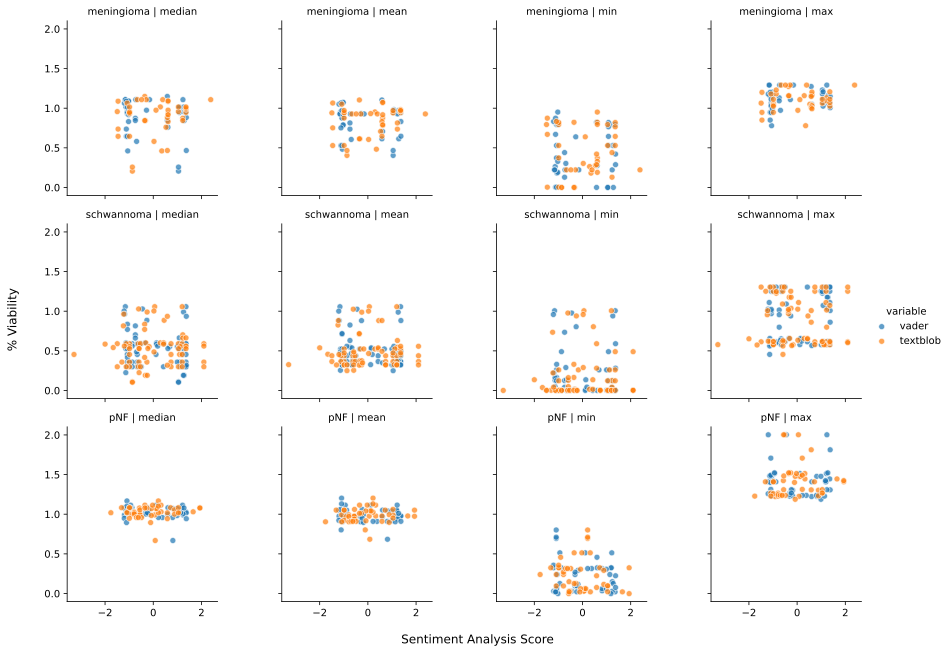

In [289]:
g = sns.FacetGrid(df_melt, row = 'condition', col = 'sum_stat', hue = 'variable');
g.map(sns.scatterplot, 'value', 'sum_value', alpha=.7);
g.set_titles(row_template = '{row_name}', col_template = '{col_name}');
g.set_axis_labels('Sentiment analysis score', '% viability');
g.add_legend();

#this surpresses the x- and y-labels on each axes of the bottom/leftmost column
g.set_axis_labels('', '') 

# overall ylabel
g.fig.text(x=0, y=0.5, 
           verticalalignment='center', #make sure it's aligned at center vertically
           s='% Viability', #this is the text in the ylabel
           size=12, #customize the fontsize if you will
           rotation=90) #vertical text

#overall xlabel
g.fig.text(x=0.5, y=0, 
           horizontalalignment='center', #make sure it's aligned at center horizontally
           s='Sentiment Analysis Score', #this is the text in the xlabel
           size=12)

# plt.tight_layout()

plt.savefig("../images/Fig1.png", dpi=410);

### Combine VADER and TextBlob

In [437]:
df_abstract_drug_2['consensus'] = [compare_sent(x, y) for x, y in zip(df_abstract_drug_2['vader'], df_abstract_drug_2['textblob'])]

In [439]:
df_abstract_drug_2.to_csv('../assets/drug_abstracts.csv', index=False)

## Drug Annotations

### MedChem Annotations

In [6]:
df_moa_1 = pd.read_csv('../assets/moa/medchem.csv', header=0, encoding = "ISO-8859-1")

In [7]:
df_moa_1 = clean_names(df_moa_1)
df_moa_1.rename(columns = {'chemcial_name':'chemical_name'}, inplace = True)
df_moa_1.chemical_name = df_moa_1.chemical_name.str.rsplit("(", n=1, expand=True).iloc[:, 0]
df_moa_1.head()

,plate,well,_catalog_number,chemical_name,_cas_number,target,pathway,alternative_names,biological_description,mwt,formula,solubility,research_area
0,HY-L009-1,A02,HY-100006A,MRT68921,NaN,ULK;,Autophagy;,MRT 68921 hydrochloride;MRT-68921 hydrochloride,MRT68921 hydrochloride is the most potent inhi...,471.0380,C25H35ClN6O,H2O: ? 31mg/mL,Cancer
1,HY-L009-1,A03,HY-10005,Flavopiridol,146426-40-6,CDK;,Cell Cycle/DNA Damage;,L868275; HMR-1275; Alvocidib,Flavopiridol competes with ATP to inhibit CDKs...,401.8402,C21H20ClNO5,DMSO ?14mg/mL Water <1.2mg/mL Ethanol ?7.8mg/mL,Cancer
2,HY-L009-1,A04,HY-10006,Flavopiridol,131740-09-5,CDK;,Cell Cycle/DNA Damage;,HL 275;NSC 649890;MDL 107826A;FLAVOPIRIDOL HCL...,Flavopiridol hydrochloride competes with ATP t...,438.3011,C21H21Cl2NO5,DMSO ?85mg/mL Water ?85mg/mL Ethanol ?9.3mg/mL,Cancer
3,HY-L009-1,A05,HY-10008,SNS-032,345627-80-7,CDK;,Cell Cycle/DNA Damage;,BMS-387032;SNS 032;SNS032;BMS 387032;BMS387032,SNS-032(BMS-387032) is a potent inhibitor of c...,380.5280,C17H24N4O2S2,DMSO ?73mg/mL Water <1.2mg/mL Ethanol ?73mg/mL,Cancer
4,HY-L009-1,A06,HY-100114,TA-01,1784751-18-3,Casein Kinase; Casein Kinase; p38 MAPK;,Cell Cycle/DNA Damage; Stem Cells/Wnt; MAPK/ER...,TA01;TA 01,"TA-01 potently inhibits CK1?, CK1?,and p38? (I...",351.3246,C20H12F3N3,10 mM in DMSO,Cancer


### Thesis Annotations

In [8]:
df_moa_2 = pd.read_csv('../assets/moa/thesis.csv', header=0)

In [9]:
df_moa_2.head()

,Drugs,MOA,Target,Phase,pert_id,moa_brd,moa_final,moa_manual
0,(-)-cotinine,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,(-)-gallocatechin gallate,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,(-)-jq1,NaN,NaN,NaN,NaN,NaN,BET inhibitor,BET inhibitor
3,(+)-3-hydroxy-n-methylmorphinan d-tartrate,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,(+)-jq1,NaN,NaN,NaN,NaN,NaN,BET inhibitor,BET inhibitor


In [10]:
df_moa_2.Drugs[1:20]

1                      (-)-gallocatechin gallate
2                                        (-)-jq1
3     (+)-3-hydroxy-n-methylmorphinan d-tartrate
4                                        (+)-jq1
5                                  (e)-capsaicin
6                             (s)-(-)-bay k 8644
7                              1-benzylimidazole
8                                        10-debc
9                                       11k-629s
10                                      12k-516s
11                                      12k-612s
12                                      12k-613s
13                                     1391-0741
14                                     1483-0018
15                                     1495-0136
16                     15-delta-prostaglandin-j2
17                                         1541b
18                     16-beta-bromoandrosterone
19                 17-beta-estradiol 17-valerate
Name: Drugs, dtype: object

## Literature Summary

### Drugs from MedChem

In [165]:
## replace - with ""
chem_list_1 = df_moa_1.chemical_name.replace("-", "", regex = True)
## set all values lower case
chem_list_1 = chem_list_1.str.lower()
## remove white spaces
chem_list_1 = chem_list_1.str.strip()
## remove duplicates
chem_list_1 = list(set(chem_list_1.to_list()))

In [197]:
idx_list_1 = []

for n in chem_list_1:
    temp_list = abstract_series.str.find(n).to_list()
    temp_idx = [i for i, j in enumerate(temp_list) if j >= 0]
    idx_list_1.append(temp_idx)

idx_drug_1 = [i for i, j in enumerate(idx_list_1) if j != []]
drug_list_1 = [chem_list_1[i] for i in idx_drug_1]
idx_list_1 = [i for i in idx_list_1 if i != []]

In [176]:
print(len(chem_list_1))

print(chem_list_1.index("pd0325901"))
print(chem_list_1.index("selumetinib"))

print(chem_list_1[189])
print(chem_list_1[176])

533
189
176
pd0325901
selumetinib


In [204]:
del idx_list_1[drug_list_1.index("bio")]
del drug_list_1[drug_list_1.index("bio")]

In [205]:
print(idx_list_1)
print()
print(drug_list_1)

[[3558], [1528, 3295], [1915], [45, 128, 192, 452, 525, 652, 659, 968, 1199, 1274, 1283, 1721, 1965, 2278, 2556, 2570, 2602, 2669, 2857, 2922, 3285, 3406, 3783, 3819, 4028, 4045, 4790, 4809, 4959, 5026, 5072, 5136, 5180, 5284], [4424], [4045], [2038], [4045], [3146, 3278, 4387], [4977], [1528, 2270, 3295, 4045], [4369], [2130], [4019], [71, 468, 1694, 2033, 3302, 5158], [779, 968, 1786, 2161, 2622, 3159, 3718, 4444, 5309], [4045, 4841], [557, 619, 1842, 1915, 2204, 2268, 3146, 4090, 4572, 4601, 4833, 4938, 5226, 5528], [430, 689, 964, 1794, 1915, 2589, 2963, 2997, 3146, 3159, 3257, 3302, 4077, 5220], [35, 361, 860, 2142, 2224, 3418], [49, 339, 2471, 3309, 4304, 5308, 5537], [545, 2806], [762, 1721, 1959, 2630, 2675, 2783, 2970, 3136, 3663, 4189], [2038], [1528, 3743], [784, 1925, 2556, 2589, 3487, 4790, 4866], [3478], [2993, 4938], [608, 1485, 1721, 2675, 2905, 4082, 4106, 4189, 4529, 5055], [963, 1415, 1703, 3204], [4045], [430, 1568, 5226], [3302], [762, 1721, 1959, 2630, 2675, 2783,

### Drugs from Thesis

In [181]:
## replace - with ""
chem_list_2 = df_moa_2.Drugs.replace("-", "", regex = True)
## set all values lower case
chem_list_2 = chem_list_2.str.lower()
## remove white spaces
# chem_list_2 = chem_list_2.str.strip()
## remove duplicates
chem_list_2 = list(set(chem_list_2.to_list()))

In [184]:
len(chem_list_2)

print(chem_list_2.index("pd0325901"))
print(chem_list_2.index("selumetinib"))

print(chem_list_2[335])
print(chem_list_2[2233])

335
2233
pd0325901
selumetinib


In [187]:
print(chem_list_2.index("azd8055"))
print(chem_list_2[684])

684
azd8055


In [298]:
idx_list_2 = []

for n in chem_list_2:
    temp_list = abstract_series.str.find(n).to_list()
    temp_idx = [i for i, j in enumerate(temp_list) if j >= 0]
    idx_list_2.append(temp_idx)

idx_drug_2 = [i for i, j in enumerate(idx_list_2) if j != []]
drug_list_2 = [chem_list_2[i] for i in idx_drug_2]
idx_list_2 = [i for i in idx_list_2 if i != []]

In [299]:
[drug_list_2[i] for i, j in enumerate(idx_list_2) if len(j) > 20]

['imatinib', 'rapamycin', 'c1', 'ite', 'fit', 'pit', 'dapt', 'ftt']

In [300]:
temp = [drug_list_2[i] for i, j in enumerate(idx_list_2) if len(j) > 20]

## remove imatinib
del temp[0]
## remove rapamycin
del temp[0]

for n in temp:
    idx = drug_list_2.index(n)
    del idx_list_2[idx]
    del drug_list_2[idx]

In [301]:
print(idx_list_2)
print()
print(drug_list_2)

[[3825], [1370, 2986], [39, 109, 402, 467, 583, 590, 870, 1075, 1142, 1150, 1549, 1777, 2060, 2313, 2353, 2415, 2588, 2651, 2977, 3085, 3426, 3459, 3651, 4351, 4369, 4507, 4568, 4670, 4711, 4802], [4335], [111], [6, 36, 45, 88, 213, 332, 426, 493, 648, 652, 667, 755, 877, 1248, 1406, 1448, 1519, 1525, 1560, 1737, 1822, 1989, 2053, 2126, 2268, 2434, 2539, 2590, 2707, 2714, 2793, 2810, 3035, 3084, 3181, 3198, 3236, 3238, 3257, 3328, 3701, 3946, 4031, 4282, 4454, 4490, 4512, 4595, 4619, 4776, 4802, 4810, 5009, 5019, 5154], [2840, 4714], [2360], [2790], [2372, 3670], [4398], [1361, 2547, 3824, 4848, 4988], [493, 551, 1660, 1728, 1990, 2051, 2852, 3707, 4147, 4175, 4391, 4488, 4753, 5015], [2263], [285, 2976], [1216, 2126], [285], [1147, 1214, 2760, 2793, 3441], [276, 819, 1702, 1858, 2721, 3052, 3304, 3709, 4245, 4327, 4366, 4396, 4591, 4598, 4929], [2717, 4488], [2263], [4859], [4586], [3909], [1323], [4658], [493], [2803, 3350], [661], [3350], [2526, 4546], [3398], [5000], [4154], [551, 

In [302]:
[drug_list_2[i] for i, j in enumerate(idx_list_2) if len(j) > 20]

['imatinib', 'rapamycin']

In [303]:
len(drug_list_2)

117

In [304]:
sum([len(i) for i in idx_list_2])

459

In [362]:
## create series with abstracts
abstract_drug_series = df_journal_en.abstract[idx_list_2[0]].append(df_journal_en.abstract[idx_list_2[1]])

for n in range(2, len(drug_list_2)):
    abstract_drug_series = abstract_drug_series.append(df_journal_en.abstract[idx_list_2[n]])
    
# print(abstract_drug_series)

## extract abstract no. for dataframe and reset index
abstract_no_list = abstract_drug_series.index.to_list()
abstract_drug_series.reset_index(drop=True, inplace=True)

## 
len_list = [len(i) for i in idx_list_2]
drug_list_rep_2 = np.repeat(drug_list_2, len_list, axis=0)

df_abstract_drug_2 = pd.DataFrame({'abstract': abstract_drug_series,
                                   'abstract_no': abstract_no_list,
                                   'drug': drug_list_rep_2})

df_abstract_drug_2.head()

,abstract,abstract_no,drug
0,Osteomalacia in neurofibromatosis is a rare en...,3825,calcitriol
1,Neurofibromatosis type 2 (NF2) is a nervous sy...,1370,saracatinib
2,Papillary renal cell carcinomas (PRCC) are a h...,2986,saracatinib
3,"In the present study, the features of gastroin...",39,imatinib
4,Object: Angiogenesis and the platelet-derived ...,109,imatinib


In [439]:
df_abstract_drug_2.to_csv('../assets/drug_abstracts.csv', index=False)